# Business Objective

This case study is to perform Exploratory Data Analysis on the past loan data to know the driving factors behind loan defaults. 

### Steps that we will be carrying out to perform EDA
<b>Data Understanding</b><br>
    Here we will be loading data in memory and try and understand shape and size of the data set.
<br><b>Data Cleaning</b><br>In this step, we will be cleaning null values or columns that won't be affecting the loan status e.g. loan_id etc.
<br><b>Univariate Analysis</b><br>This is the step where we will be checking individual variables and see their distribution.
<br><b>Bivariate Analysis</b><br>In this step we will be analysing two variables together with various graphs.
<br>
<b>Multi-variate Analysis</b><br>Here we will be checking multiple variables together and seeing effect of them on each other.
###

##  Data Understanding

###### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

###### Load CSV

In [2]:
loan = pd.read_csv('loan.csv')

In [3]:
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [5]:
loan.shape

(39717, 111)

In [6]:
loan.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object

In [7]:
loan.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


##  Data Cleaning

In [8]:
## Load the columns and if null values for them in a series variable as we have more than 100 columns 
cols = round(loan.isnull().mean()*100,2)

In [9]:
## any columns that are 100% null, store them in an list
null_cols = []
i = len(cols)
for i in range(0,len(cols)):
    if cols[i] == 100:
        null_cols.append(cols.index[i])

In [10]:
## drop the columns that are 100% null
for null_col in null_cols:
    loan = loan.drop(null_col, axis=1)

In [11]:
## check the shape of the dataset now
loan.shape

(39717, 57)

In [12]:
## check how many more columns have null value
round(loan.isnull().mean()*100,2)

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.58
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

We still have few columns where more than 50% of values are null. Let's remove thme 

In [13]:
## collect all the columns where they are more than 50% null
cols = round(loan.isnull().mean()*100,2)
null_cols_50 = []
i = len(cols)
for i in range(0,len(cols)):
    if cols[i] > 50:
        null_cols_50.append(cols.index[i])

In [14]:
## drop the columns from null_cols_50 list
for null_col in null_cols_50:
    loan = loan.drop(null_col, axis=1)

In [15]:
## URL in the dataset is unique and same as member id
loan = loan.drop("url",axis=1)

In [16]:
## check unique values for the numerical columns 
loan[['policy_code','chargeoff_within_12_mths','delinq_amnt','tax_liens','collections_12_mths_ex_med','acc_now_delinq']].describe()


,policy_code,chargeoff_within_12_mths,delinq_amnt,tax_liens,collections_12_mths_ex_med,acc_now_delinq
count,39717.0,39661.0,39717.0,39678.0,39661.0,39717.0
mean,1.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0
min,1.0,0.0,0.0,0.0,0.0,0.0
25%,1.0,0.0,0.0,0.0,0.0,0.0
50%,1.0,0.0,0.0,0.0,0.0,0.0
75%,1.0,0.0,0.0,0.0,0.0,0.0
max,1.0,0.0,0.0,0.0,0.0,0.0


In [17]:
## dropping numerical columns which have one value as they may not affect the loan status

loan = loan.drop(['policy_code','chargeoff_within_12_mths','delinq_amnt','tax_liens','collections_12_mths_ex_med','acc_now_delinq'],axis=1)

In [18]:
loan.shape

(39717, 47)

In [19]:
print(loan['initial_list_status'].unique() + ',' + loan['pymnt_plan'].unique() +',' + loan["application_type"].unique())

['f,n,INDIVIDUAL']


In [20]:
## drop the categorical column which have single values
loan = loan.drop(['initial_list_status','pymnt_plan','application_type'],axis=1)

In [21]:
## check the shape of the loan
loan.shape

(39717, 44)

In [22]:
## Description and Title columns are not needed as they do not drive the loan status

loan = loan.drop(['desc','title'],axis=1)

##### Formatting Columns

In [23]:
## format the interest rate column to float

loan["int_rate"]= loan["int_rate"].apply(lambda x:float(x[:-1]))

In [24]:
## check where revol_util column is null
loan[loan['revol_util'].isnull()]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
3565,1016416,1244120,8000,8000,8000.000000,36 months,19.42,294.95,E,E3,...,10706.01,8000.00,2691.01,15.000000,0.00,0.0000,Dec-14,76.83,Dec-15,0.0
4714,997734,1222858,6100,6100,6100.000000,36 months,14.27,209.29,C,C2,...,1755.22,989.91,471.90,0.000000,293.41,2.8200,Jun-12,209.29,Nov-12,0.0
4943,790093,994164,7200,7200,7200.000000,36 months,14.27,247.03,C,C2,...,7306.07,7200.00,106.07,0.000000,0.00,0.0000,Apr-12,66.27,Mar-14,0.0
11282,817195,1024992,5000,5000,5000.000000,36 months,21.36,189.31,F,F4,...,6814.70,5000.00,1814.70,0.000000,0.00,0.0000,Aug-14,204.01,Feb-15,0.0
12042,804073,1009899,3000,3000,3000.000000,60 months,22.11,83.05,G,G1,...,498.49,113.96,217.52,0.000000,167.01,30.0618,Nov-11,83.05,Apr-12,0.0
12147,802201,1007832,4275,4275,4275.000000,36 months,15.99,150.28,D,D2,...,5356.19,4275.00,1081.19,0.000000,0.00,0.0000,Dec-13,1166.73,Jan-14,0.0
13891,772732,974723,2000,2000,1900.000000,36 months,18.39,72.70,E,E2,...,89.79,0.00,0.00,0.000000,89.79,0.8500,NaN,0.00,Nov-11,0.0
17985,706991,899283,20000,20000,4575.003440,60 months,20.48,535.24,G,G2,...,1452.03,2091.72,3252.38,0.000000,1030.96,185.5728,Feb-12,535.24,Jul-12,0.0
18184,702880,894759,1825,1825,1825.000000,36 months,12.68,61.22,C,C1,...,1930.96,1825.00,105.96,0.000000,0.00,0.0000,May-12,223.80,May-12,0.0
21604,641703,821414,2500,2500,2500.000000,36 months,16.69,88.75,E,E3,...,3197.34,2500.00,697.34,0.000000,0.00,0.0000,Jan-14,99.82,Feb-14,0.0


In [25]:
## fill null values with 0%
loan['revol_util'] = loan['revol_util'].fillna('0%')

In [26]:
## convert revol util to float
loan['revol_util'] = loan['revol_util'].apply(lambda x: float(x[:-1]))

In [27]:
## split the columns which are numerical, categorical and extra_cols


numerical_cols = ['loan_amnt','funded_amnt','funded_amnt_inv','int_rate','installment','annual_inc','dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_amnt','pub_rec_bankruptcies']

## below columns are the ones where we have definite list of values
cat_cols_narrow=['term','grade','sub_grade','emp_length','home_ownership','verification_status']

## below columns have wide range of values
cat_cols_wide=['issue_d','purpose','addr_state','earliest_cr_line','last_pymnt_d','last_credit_pull_d']

extra_cols=['id','member_id','emp_title']

# analysis colums
analysis_cols = ['loan_status']


##  Univariate Analysis


### Numerical Columns

Histplot of loan_amnt


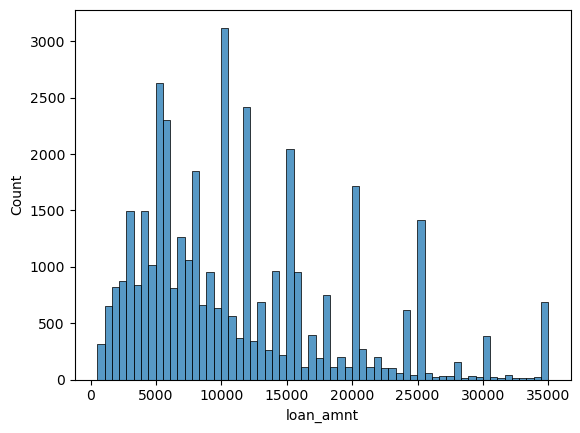

Histplot of funded_amnt


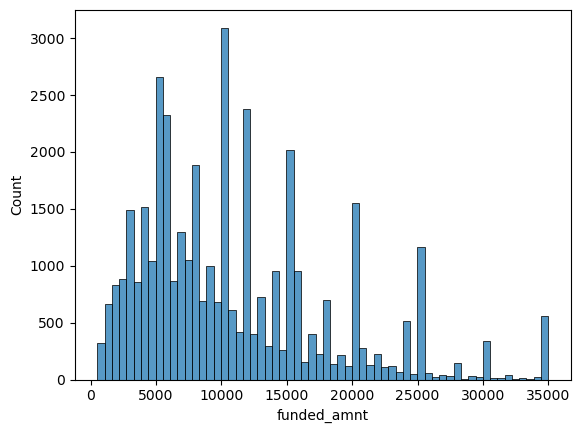

Histplot of funded_amnt_inv


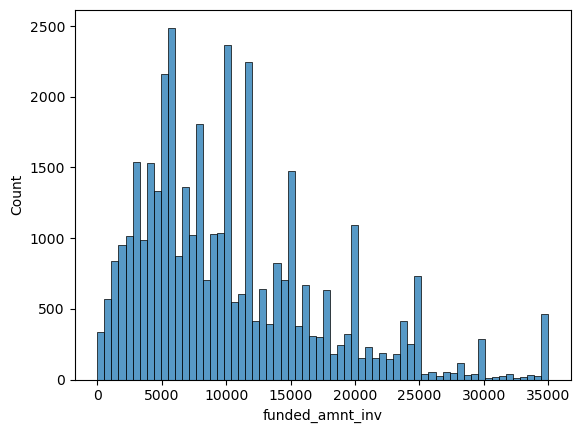

Histplot of int_rate


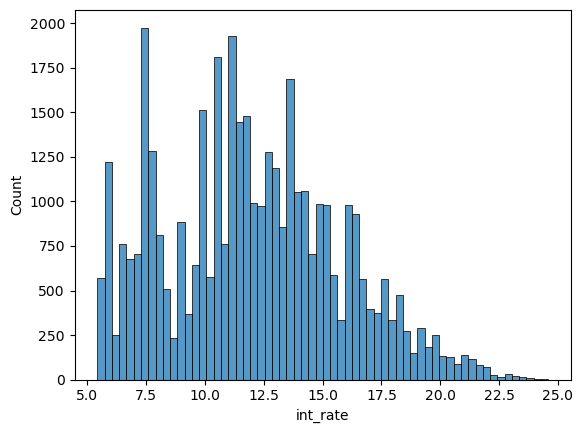

Histplot of installment


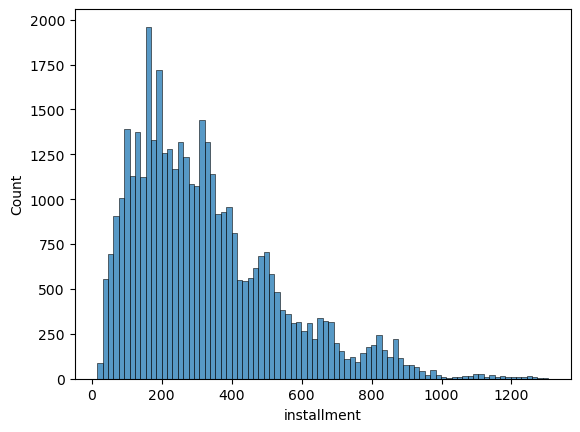

Histplot of annual_inc


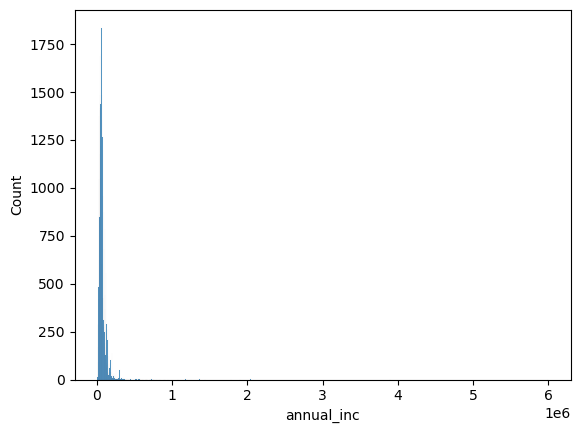

Histplot of dti


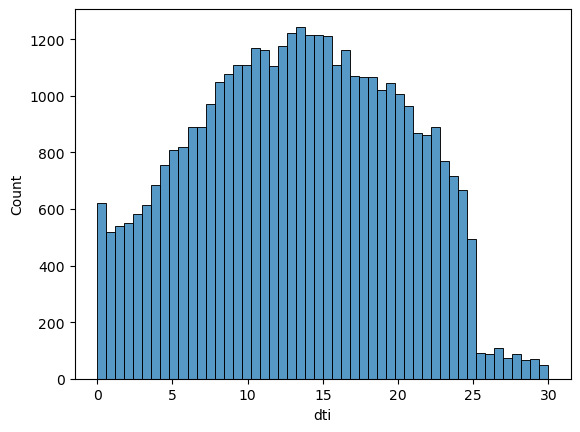

Histplot of delinq_2yrs


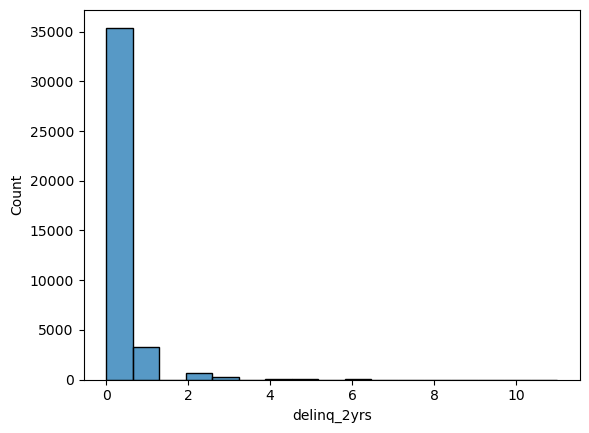

Histplot of inq_last_6mths


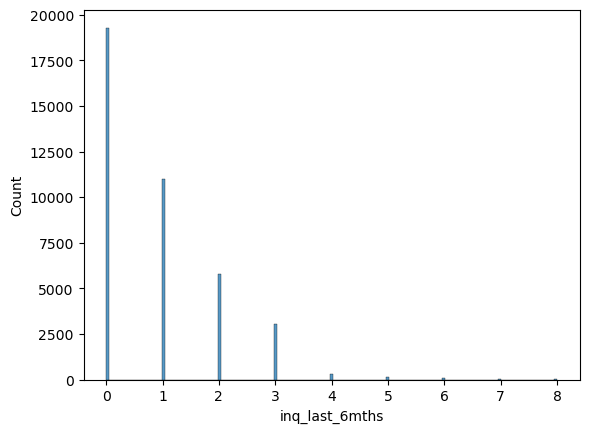

Histplot of open_acc


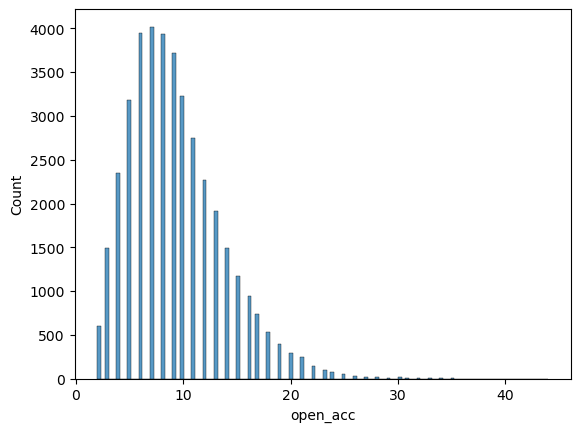

Histplot of pub_rec


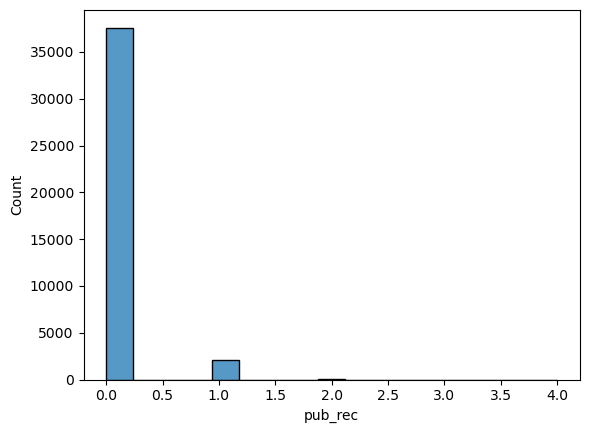

Histplot of revol_bal


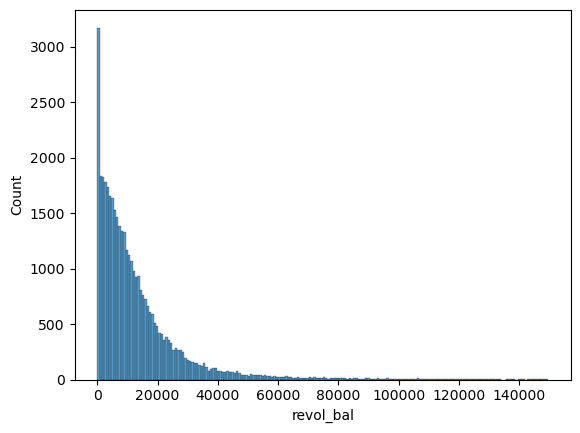

Histplot of revol_util


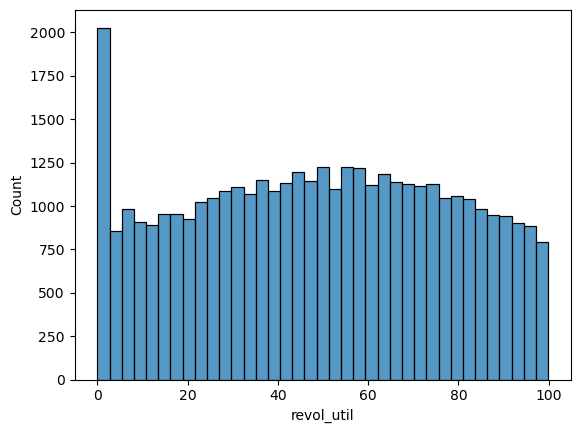

Histplot of total_acc


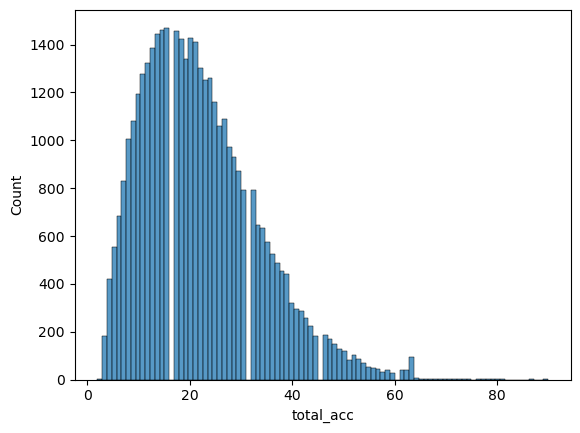

Histplot of out_prncp


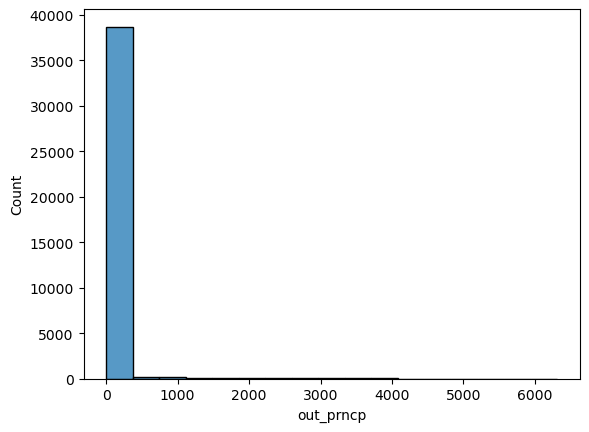

Histplot of out_prncp_inv


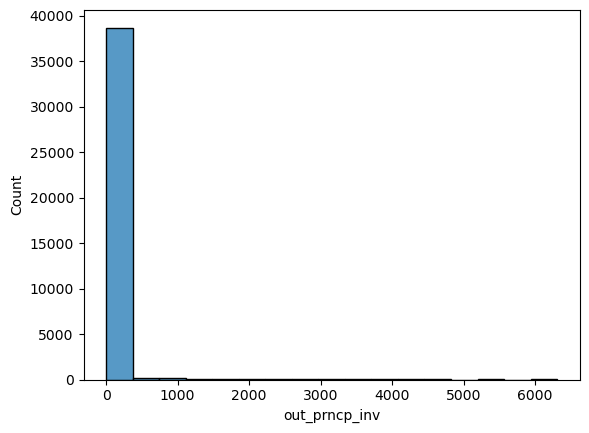

Histplot of total_pymnt


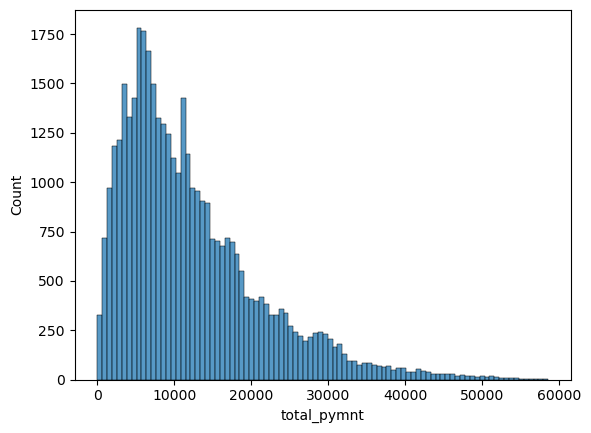

Histplot of total_pymnt_inv


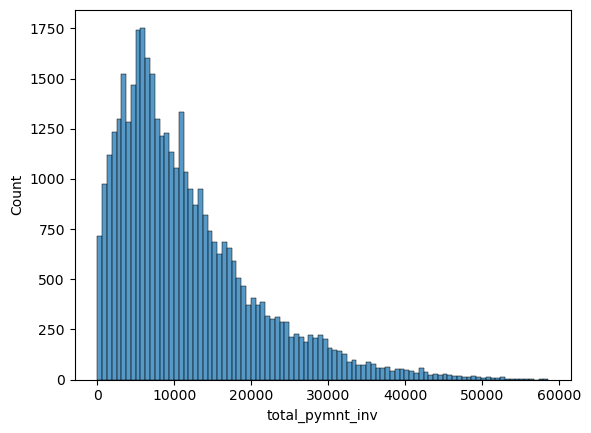

Histplot of total_rec_prncp


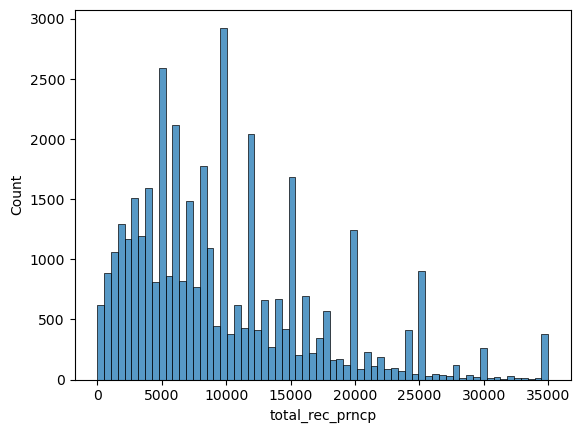

Histplot of total_rec_int


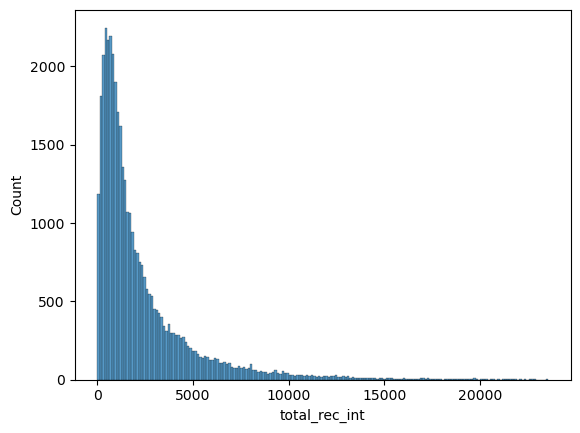

Histplot of total_rec_late_fee


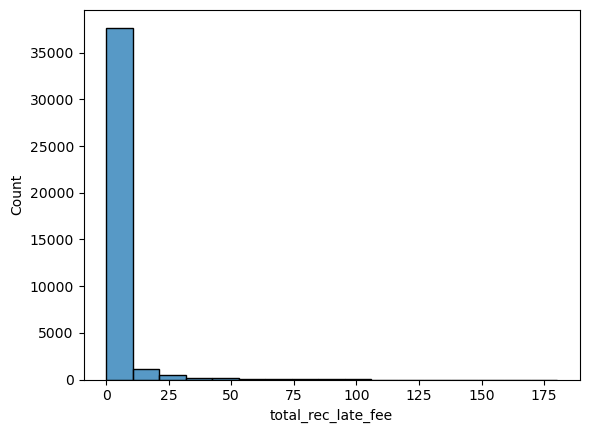

Histplot of recoveries


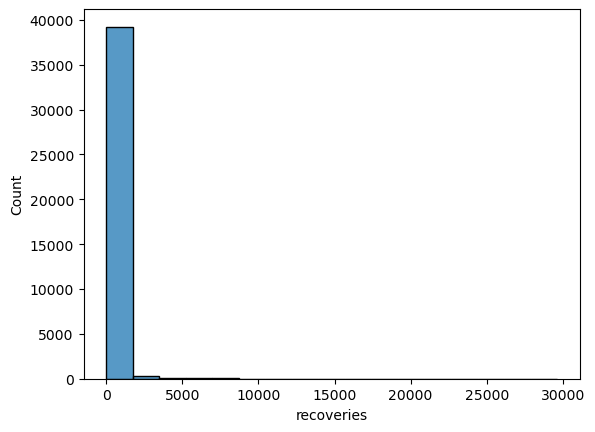

Histplot of collection_recovery_fee


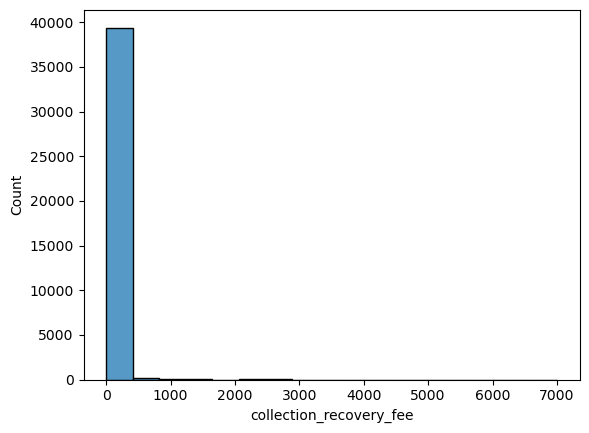

Histplot of last_pymnt_amnt


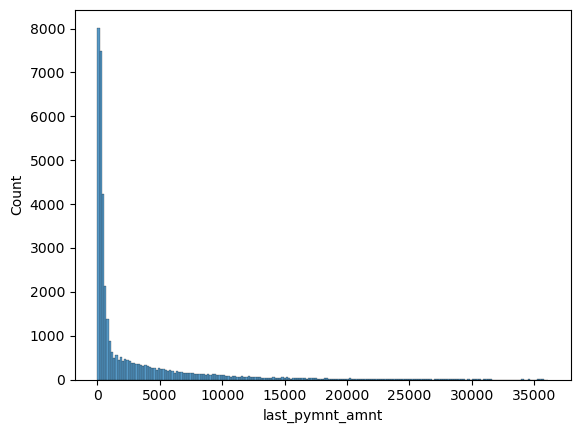

Histplot of pub_rec_bankruptcies


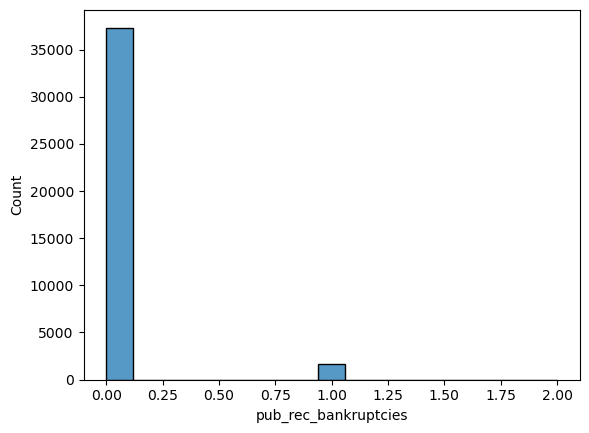

In [29]:
## plot the histogram for numerical columns

for i in numerical_cols: 
    print("Histplot of",i) 
    sns.histplot(x=loan[i]) 
    plt.show()

##### Observations based on the histoplots of numerical values:
1. Loans with loan amount of approx 100000 are the highest with being more than 3000 customers with those loans and highest loan amount being approx 35000
2. 'funded_amt' and 'funded_amnt_inv' follow similar distribution as loan amount
3. loans with int_rate approx 7.5 are the highest followed by approx 11%
4. Highest installment is above rs. 1200 and most installments (approx.1900) are slightly lower than rs. 200
5. Annual_inc seems to be skewed towards 0 because of the very high income values in the dataset

Countplot of term


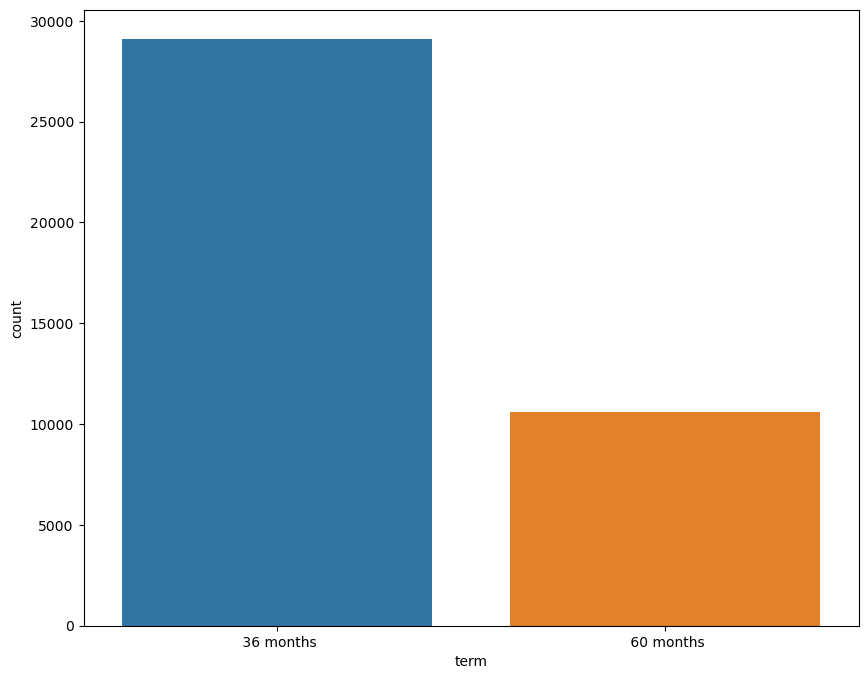

Countplot of grade


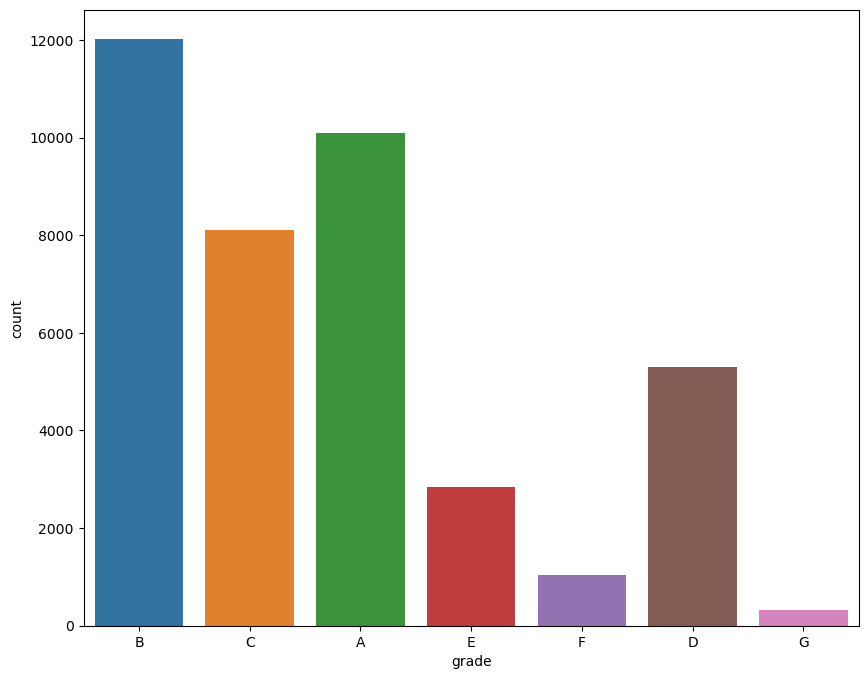

Countplot of sub_grade


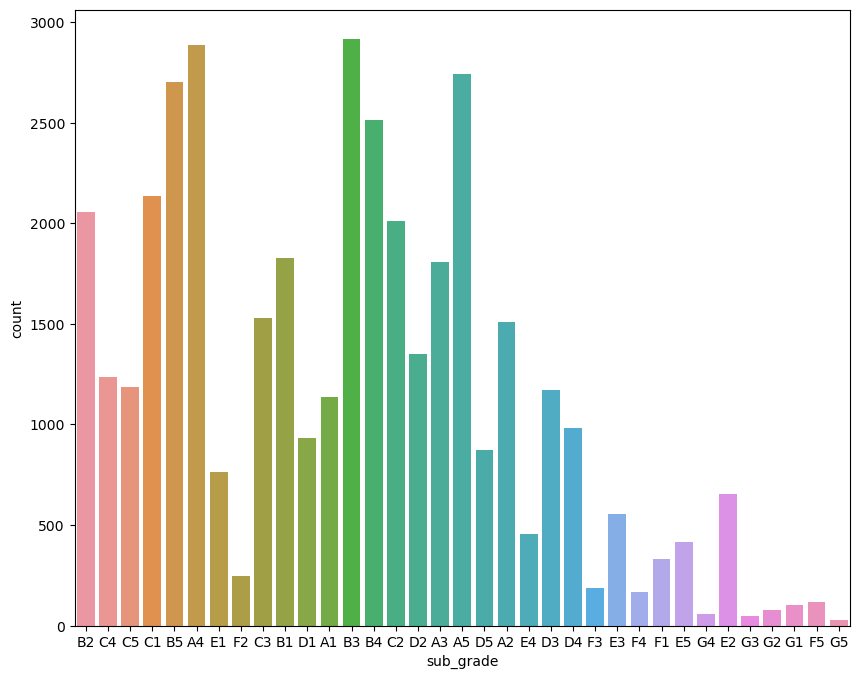

Countplot of emp_length


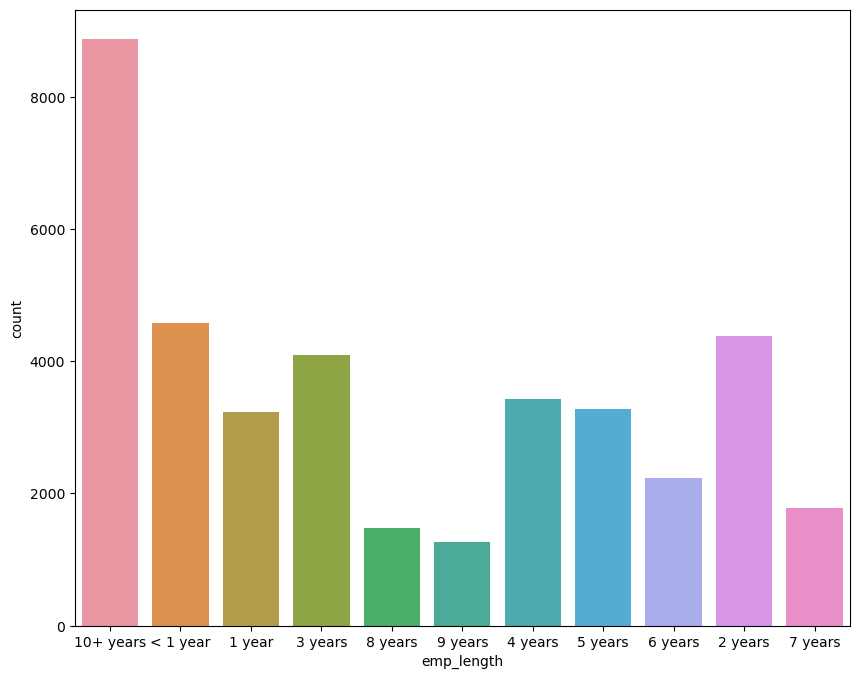

Countplot of home_ownership


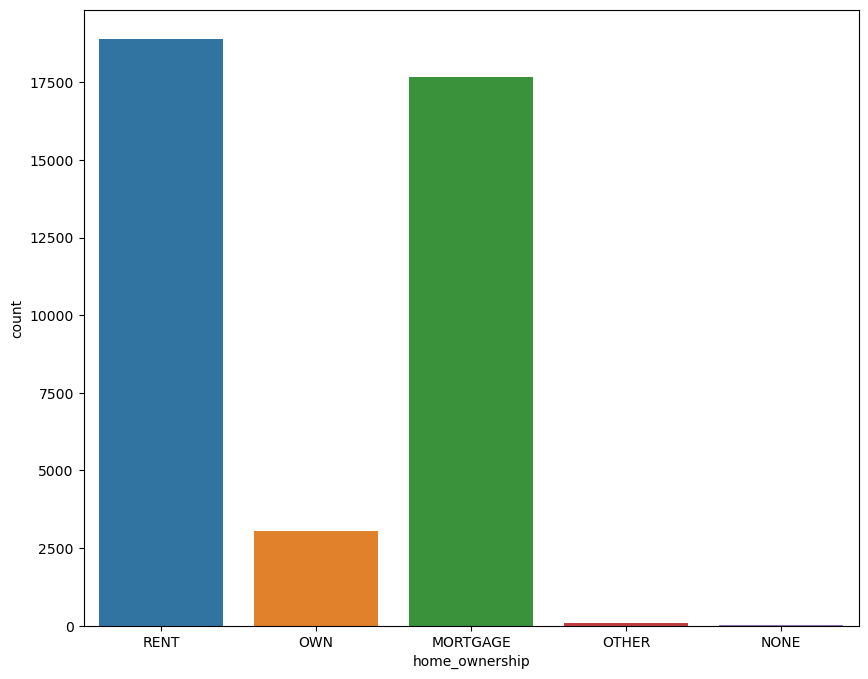

Countplot of verification_status


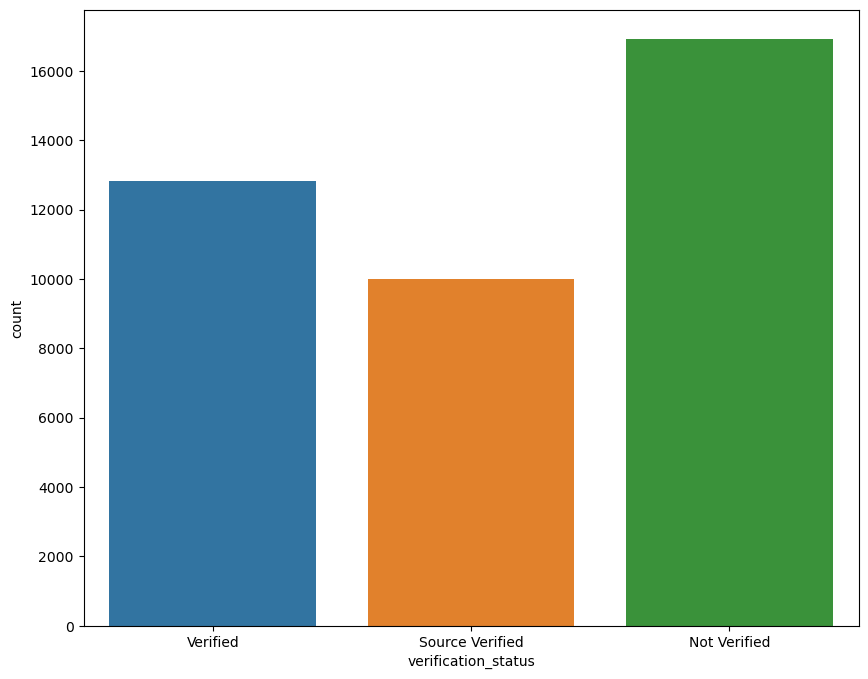

In [30]:
for i in cat_cols_narrow: 
    plt.figure(figsize=(10,8))
    print("Countplot of",i) 
    sns.countplot(x=loan[i]) 
    plt.show()

##### Observations based on the histoplots of categorical values:
1. Loans with 36 months are approx 3 times more than loans with 60 months
2. Employees with Grade B are the most and with Grade G are the least
3. Employees with experience more than 10 years are the most and employees with 9 years of experience are the least
4. loans with 'Fully Paid' status are 6 times the 'Charged off' status

##  Bi-variate Analysis

Although we could see the distribution of the values with countplot and the histoplots, we would like to see how they affect the loan_status. Hence we will do the bi-variate analysis to see the correlation between loan_status and other variables one by one

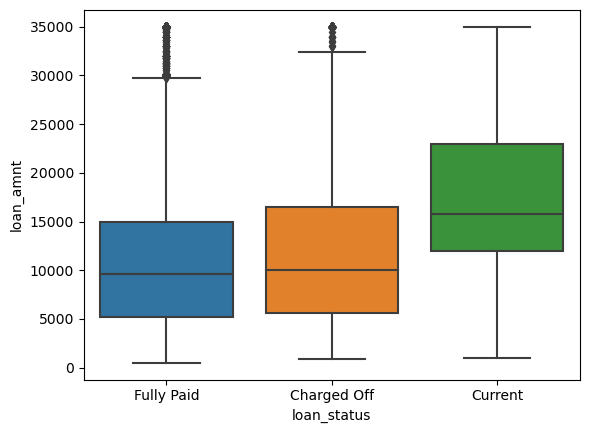

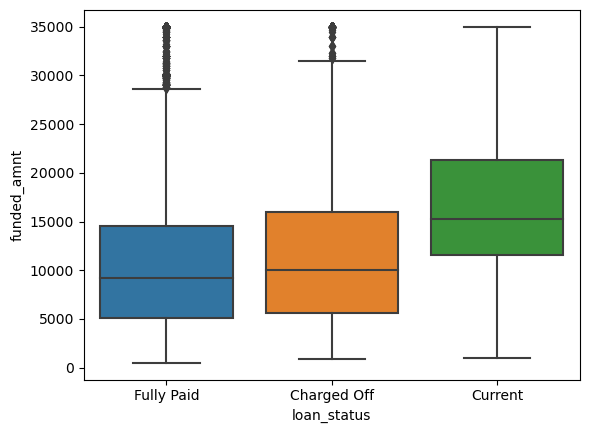

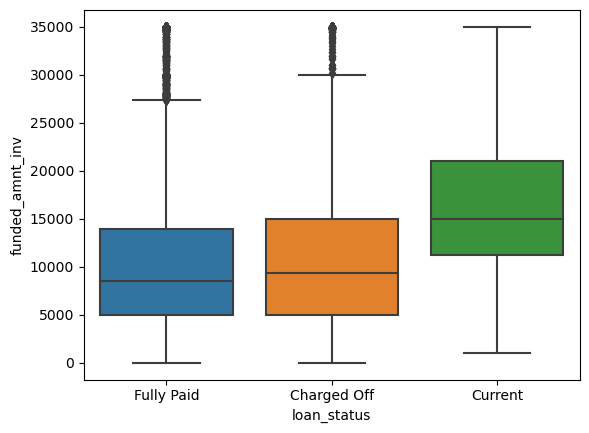

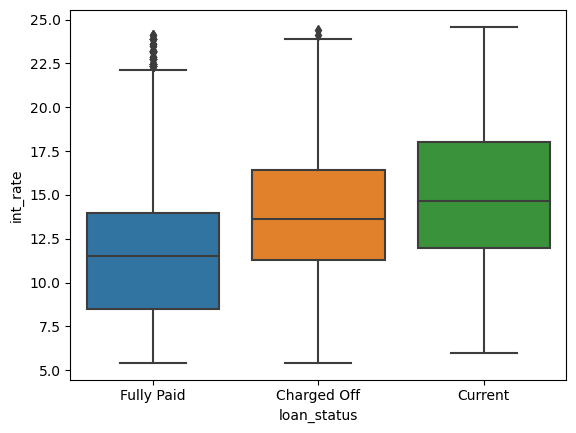

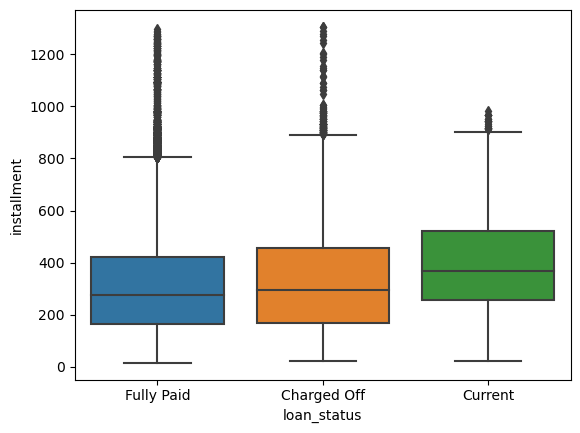

...

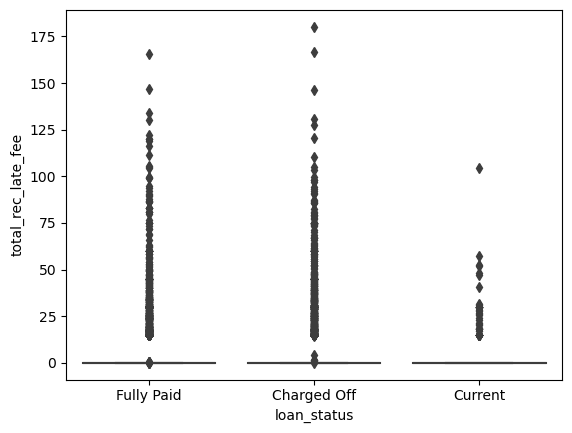

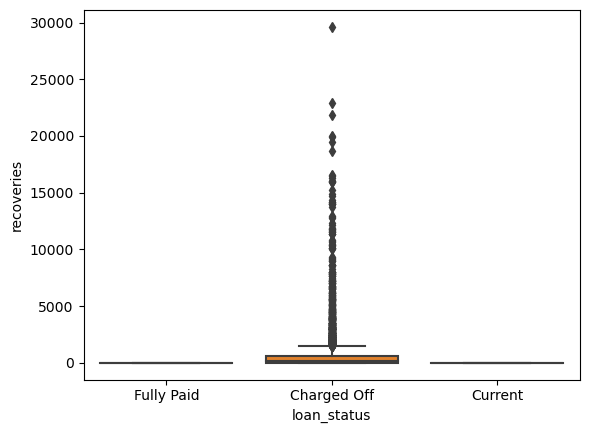

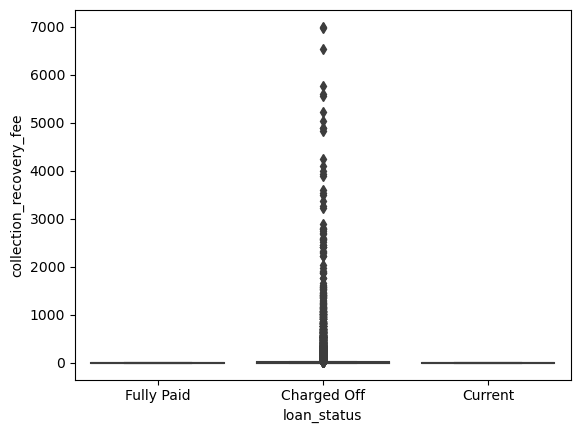

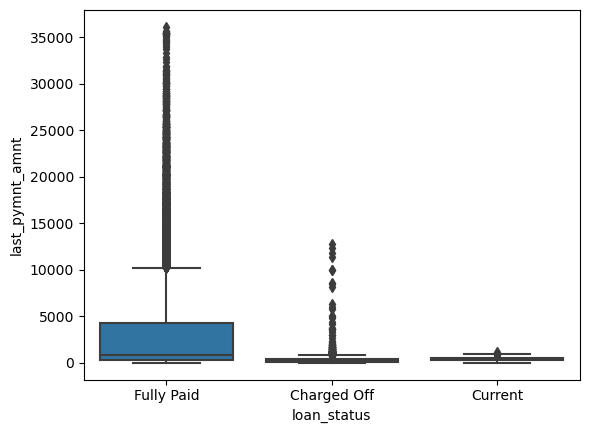

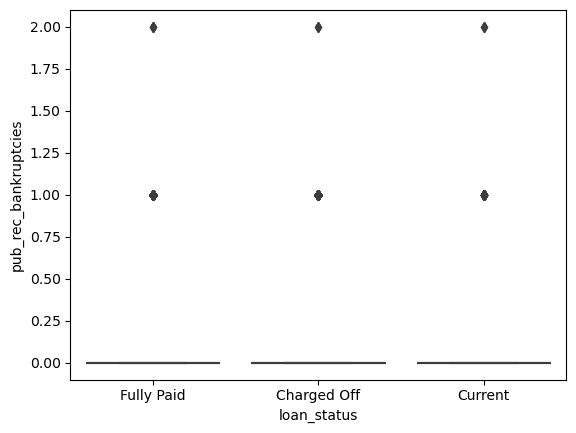

In [31]:
for i in numerical_cols:
    sns.boxplot(data=loan,x='loan_status',y=i)
    plt.show()

##### Observations based on the above boxplots for numerical values against loan status:

1. We can see that for the 'Charged Off' loans, mean int_rate is higher than the for the loans are are 'Fully Paid'. We also see that 25th%, 75% percentile values for 'Charged Off' loans are higher than that for the 'Fully Paid' loans
2. We cannot see how the annual income affects the loan status with box plots because of the outliers. 
3. loan_amnt does not have vary much between 'Fully Paid' and 'Charged Off' loans. For 'Current' loans the loan_amnt is signficantly higher.

In [32]:
(pd.qcut(loan['annual_inc'],q=10)).value_counts()

(37500.0, 45000.0]       4719
(3999.999, 30000.0]      4624
(75600.0, 90000.0]       4141
(65844.4, 75600.0]       3991
(116000.0, 6000000.0]    3946
(59000.0, 65844.4]       3940
(50400.0, 59000.0]       3934
(90000.0, 116000.0]      3809
(30000.0, 37500.0]       3345
(45000.0, 50400.0]       3268
Name: annual_inc, dtype: int64

In [33]:
## Let's use bins to check relation with the the annual_inc
loan['annual_inc_bin'] = pd.qcut(loan['annual_inc'],q=10, labels=["<30000","<37500","<45000","<50400","<59000","<65844","<75600","<90000","<116000","<6000000"])


In [34]:
cat_cols_narrow.append('annual_inc_bin')

## Bivariate for categorical columns
Let's check how the categorical columns are affecting the loan_status

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


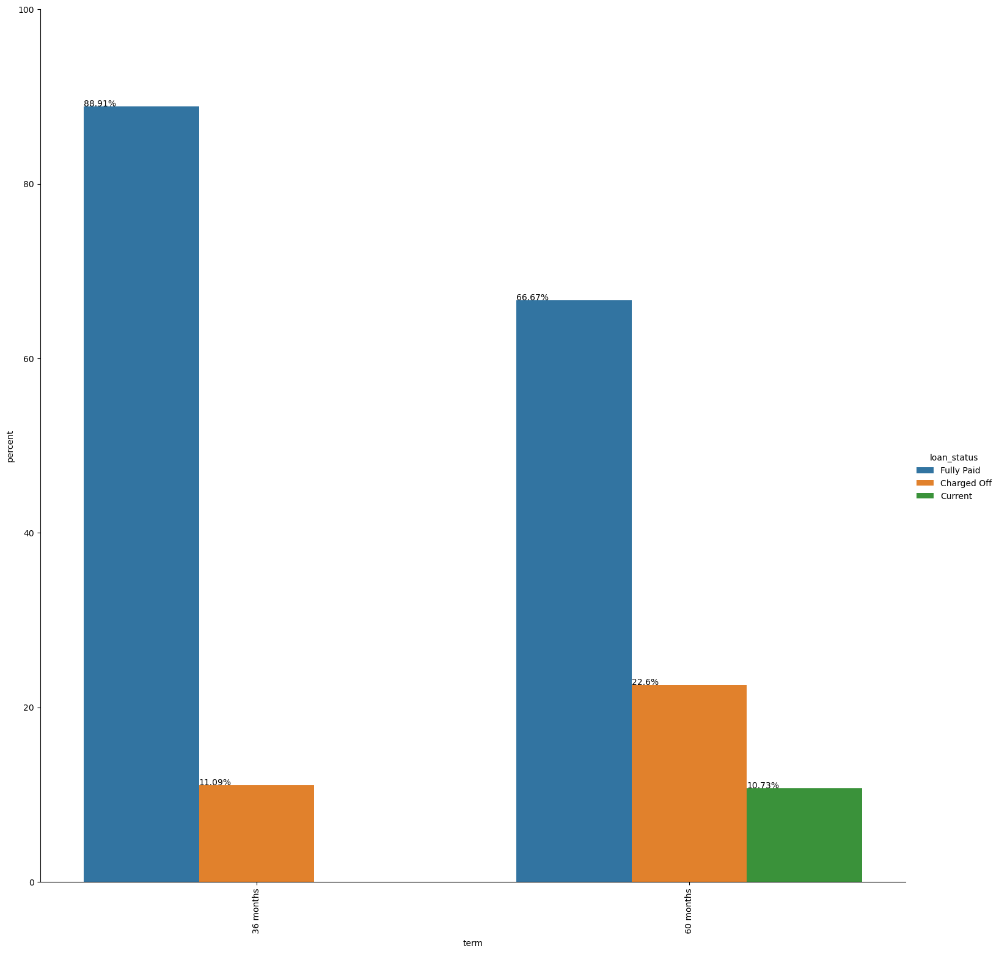

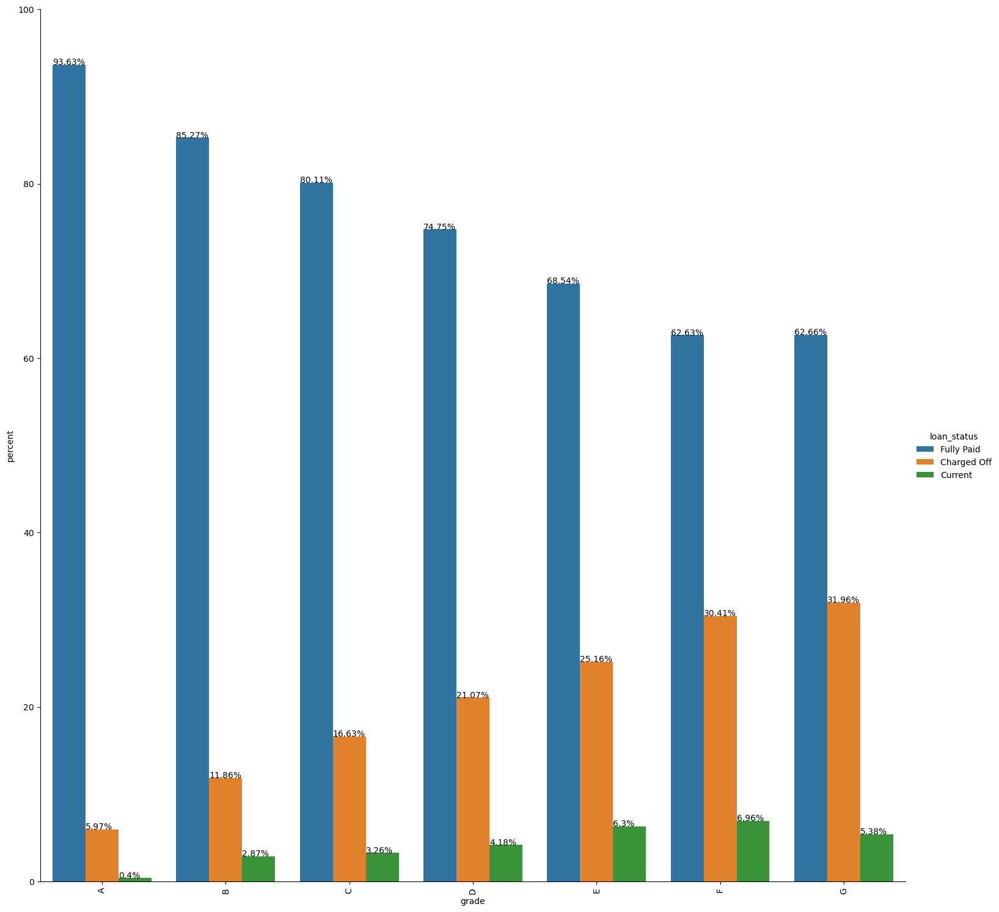

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


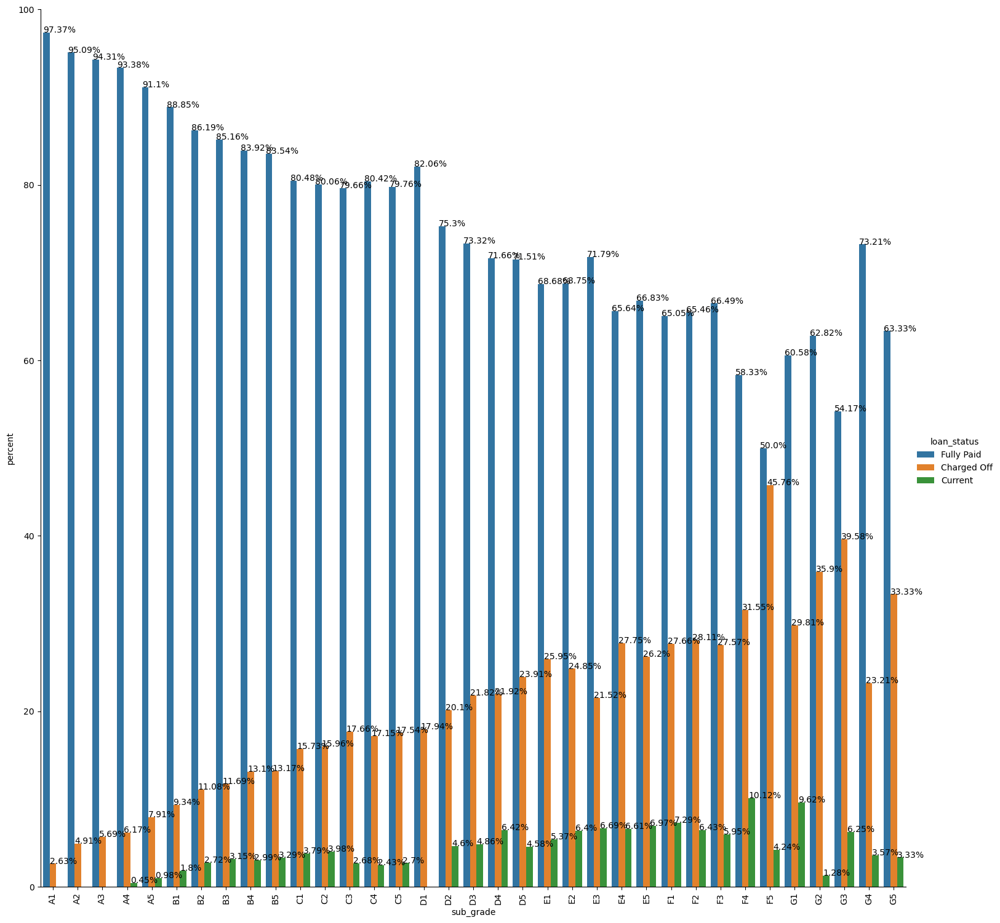

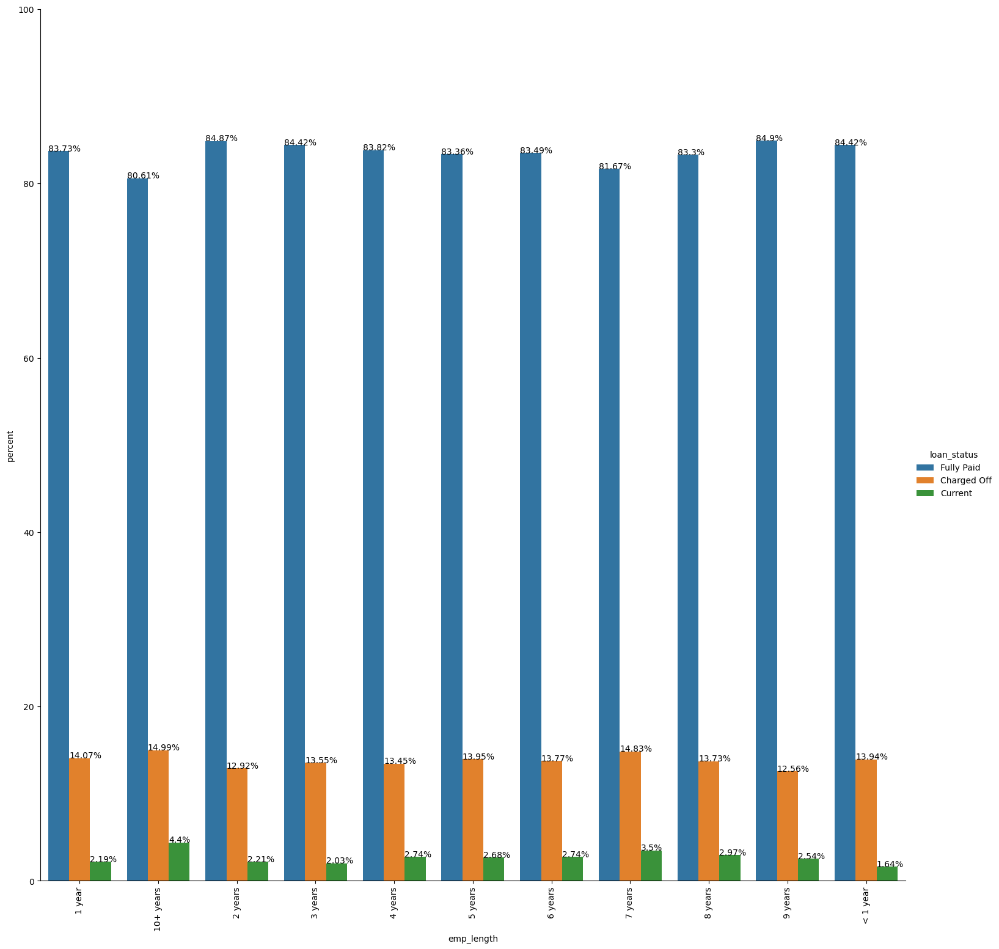

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


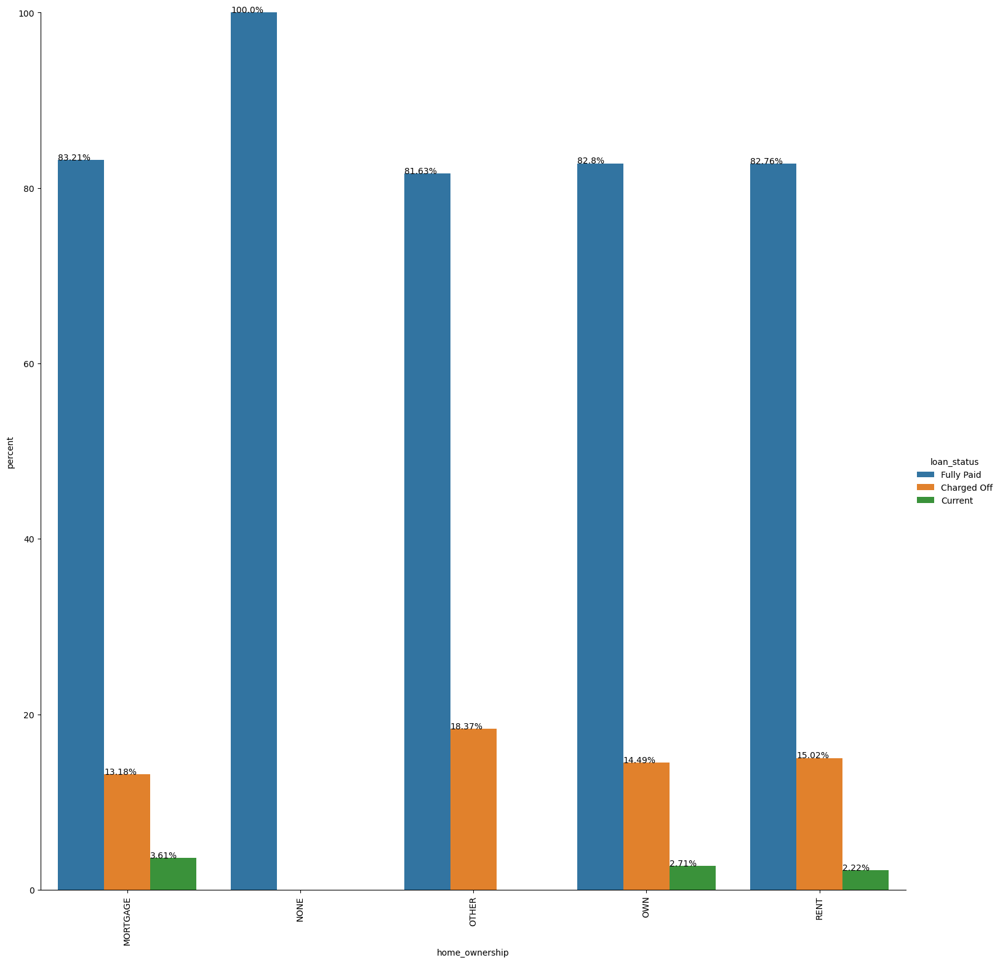

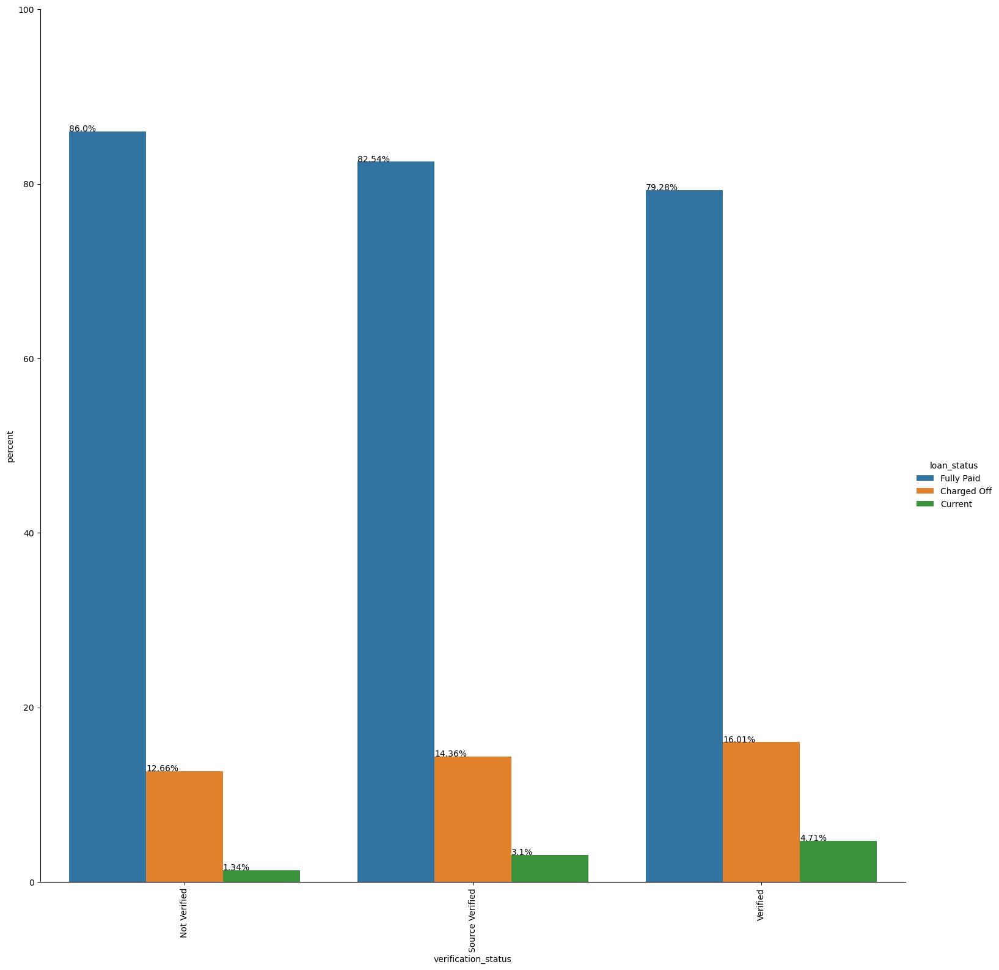

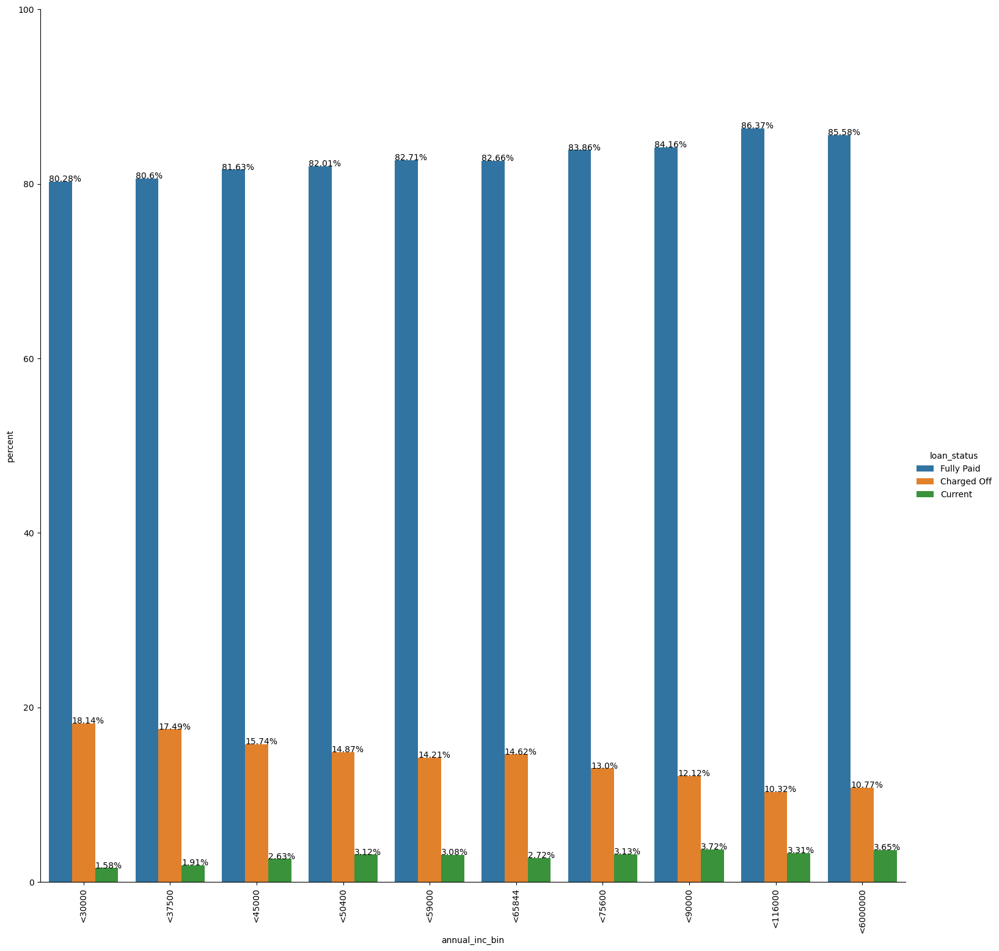

In [35]:
for i in cat_cols_narrow:
    x, y = i, 'loan_status'
    loan3 = loan.groupby(x)[y].value_counts(normalize=True)
    loan3 = loan3.mul(100)
    loan3 = loan3.rename('percent').reset_index()
    g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=loan3, height=15)
    g.ax.set_ylim(0,100)
    g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=90)
    for p in g.ax.patches:
        txt = str(p.get_height().round(2)) + '%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        g.ax.text(txt_x,txt_y,txt)

##### Observations based on the % countplots for categorical coulmns and loan status

1. Employees whose income is less than 30000, 18% of those employees have defaulted loans. 
2. Employees who own their homes have not defaulted at all.
3. Employees where the home_ownership is either 'OTHER' or 'RENT' have high % of default
4. 45% of loans given to employees with sub-grade F5 have defaulted.
5. Loans with '60 months' term have defaulted more than loans with '36 months'

### Check the effect of issue_d, purpose, addr_state on the loan_status

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

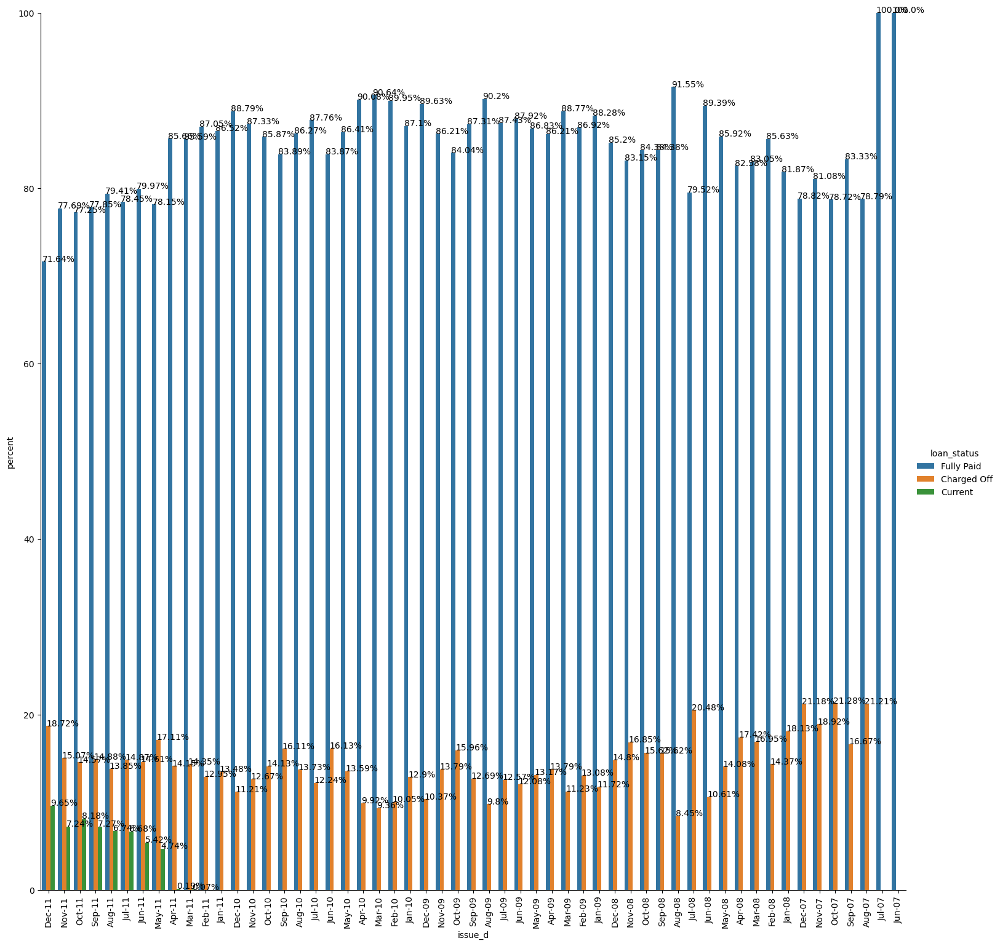

In [37]:
## check effect of issue_d
x, y = 'issue_d', 'loan_status'
loan3 = loan.groupby(x,sort=False)[y].value_counts(normalize=True)
loan3 = loan3.mul(100)
loan3 = loan3.rename('percent').reset_index()
g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=loan3, height=15)
g.ax.set_ylim(0,100)
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=90)
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


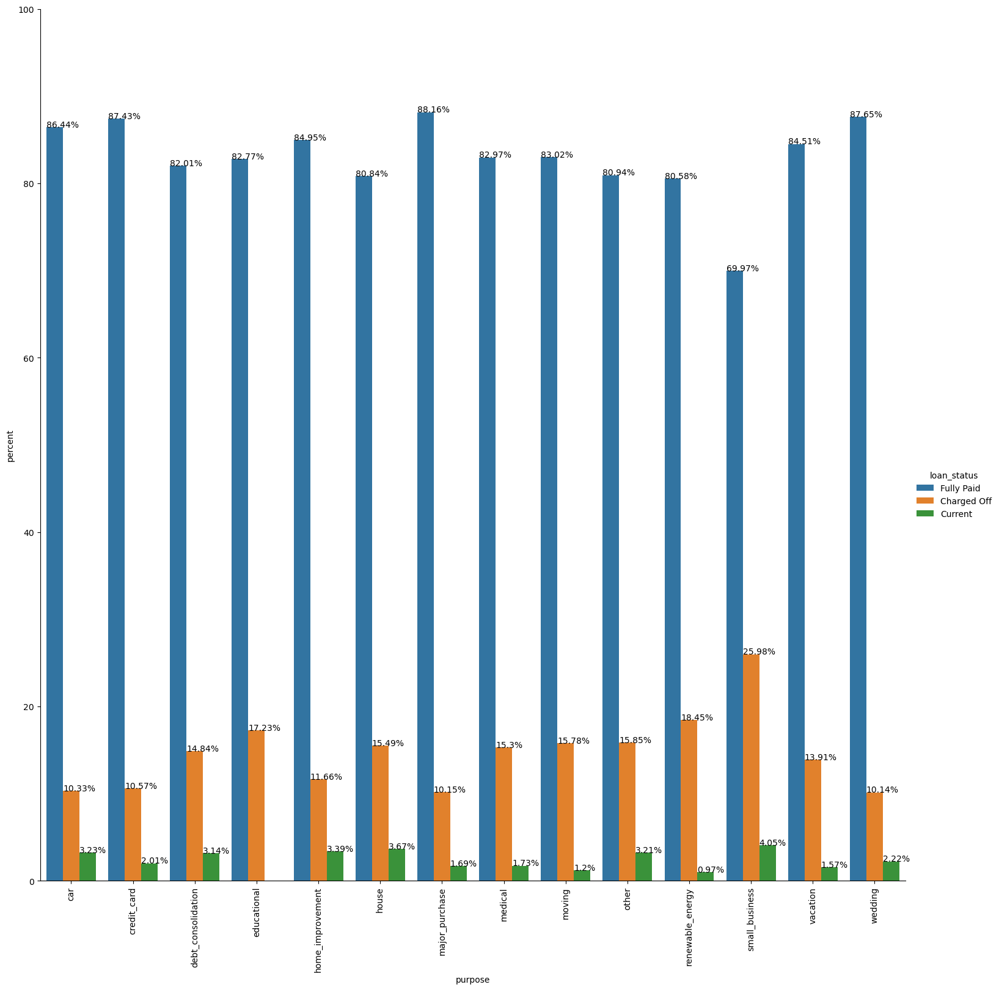

In [38]:
## check effect of purpose
x, y = 'purpose', 'loan_status'
loan3 = loan.groupby(x)[y].value_counts(normalize=True)
loan3 = loan3.mul(100)
loan3 = loan3.rename('percent').reset_index()
g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=loan3, height=15)
g.ax.set_ylim(0,100)
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=90)
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

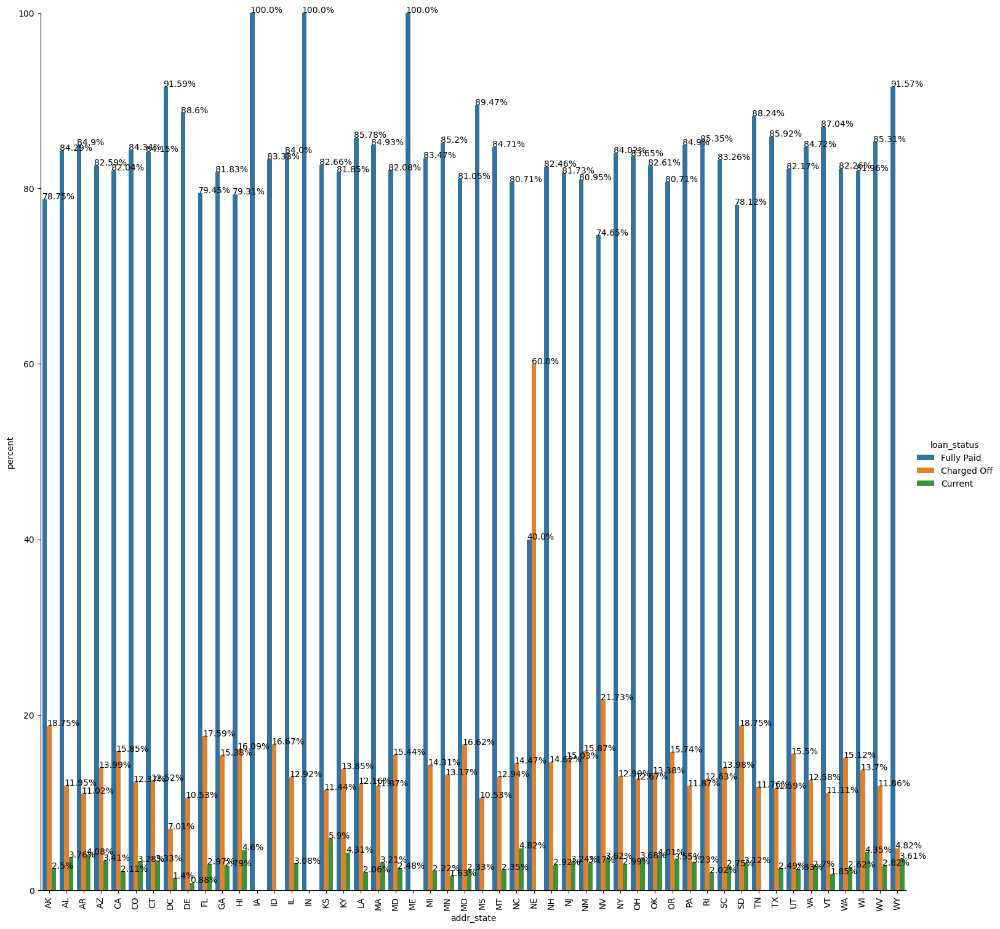

In [41]:
## check effect of addr_state
x, y = 'addr_state', 'loan_status'
loan3 = loan.groupby(x)[y].value_counts(normalize=True)
loan3 = loan3.mul(100)
loan3 = loan3.rename('percent').reset_index()
g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=loan3, height=15)
g.ax.set_ylim(0,100)
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=90)
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

##### Observations based on the % countplots for issue_d, purpose and addr_state and loan status
1. On an average 20% of Loans issued in Aug-07 until Dec-07 were defaulted.
2. We see this same trend for the loans issued 2011 where more and more loans are getting defaulted
3. 26% of the loans issued for the small_business have defaulted
4. More than 20% loans issued in Nebraska, Nevaa have been defaulted and more than 18% of the loans from Arkasnsas, South Dakota were defaulted. 


## Multivariate Analysis

Let's check the relation one of more variables with loan status

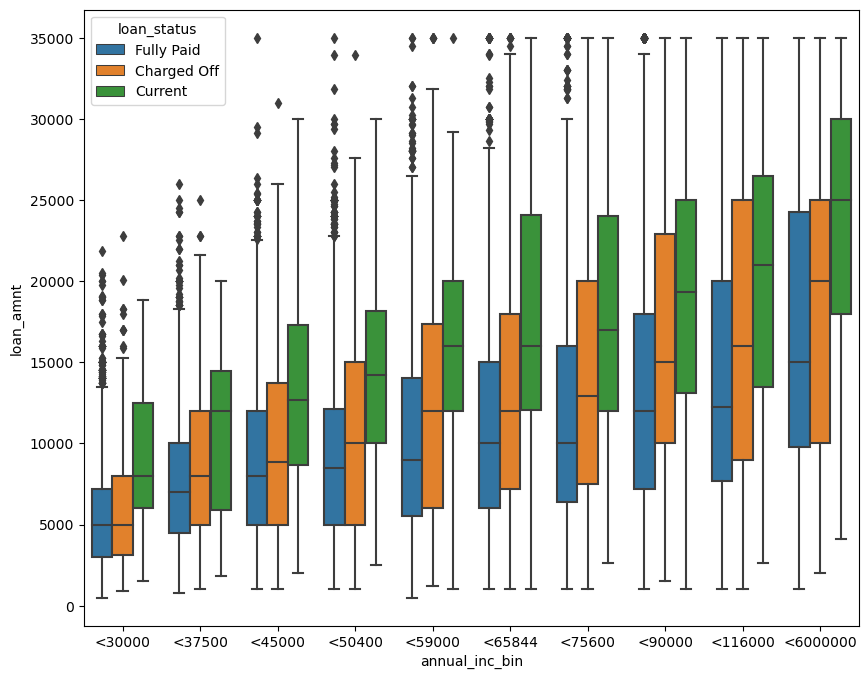

In [42]:
## Let's check the range of loan_amnt for the annual income for various loan status
plt.figure(figsize=(10,8))
sns.boxplot(data=loan,x='annual_inc_bin',y='loan_amnt', hue='loan_status')
plt.show()

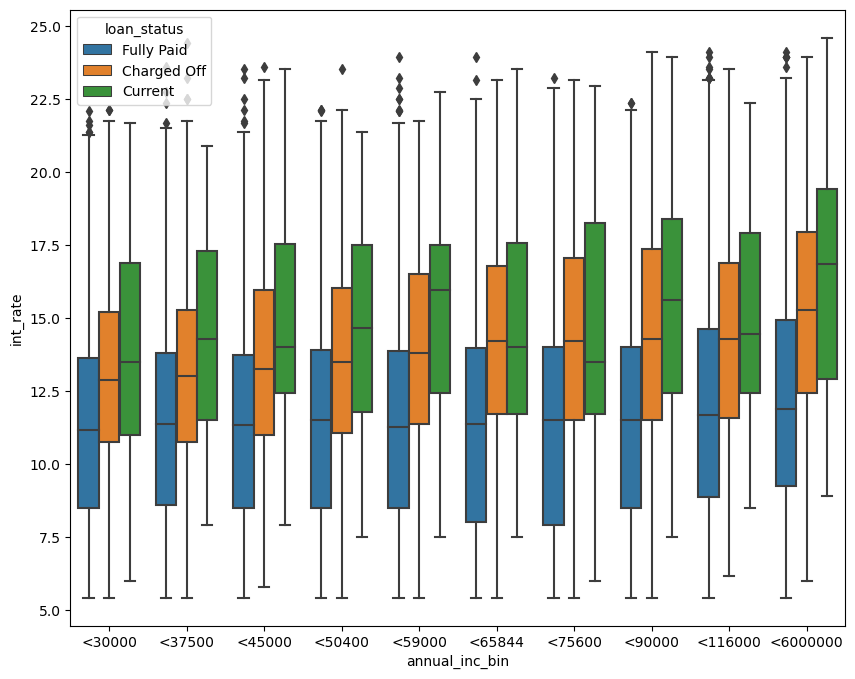

In [43]:
## Let's check the range of int_rate for the annual income for various loan status
plt.figure(figsize=(10,8))
sns.boxplot(data=loan,x='annual_inc_bin',y='int_rate', hue='loan_status')
plt.show()

##### Observations from last two graphs
1. For all annual income ranges, mean loan amount is higher for 'Charged Off' loans than the mean loan amount for 'Fully Paid' loans
2. For all annual income ranges, mean interest rate 2.5 points or more for 'Charged Off' loans than 'Fully Paid' loans


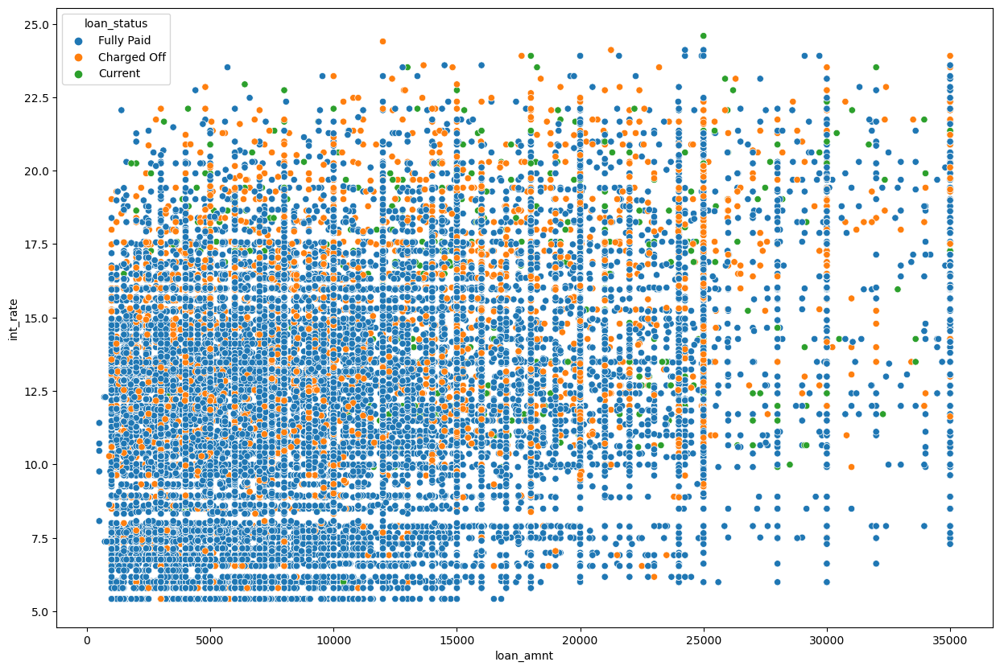

In [44]:
## Let's check trend of int_rate and annaual income for loan status

plt.figure(figsize=(15,10))
sns.scatterplot(data=loan,x='loan_amnt',y='int_rate',hue='loan_status')
plt.show()

##### Observations based on scatter plot

Data is very dense on these scatter plots but we can see that most 'Charged Off' loans are where both 'loan_amnt' and the 'int_rate' are higher. 

In [45]:
## Let's plot line plot on to see how time affected int rate and annual incomes. Before that let's convert the issue_d in readable date

from datetime import datetime
#datetime.strptime(loan.iloc[0]['issue_d'],'%b-%y').year
loan['issue_year'] = loan['issue_d'].apply(lambda x:datetime.strptime(x,'%b-%y').year)


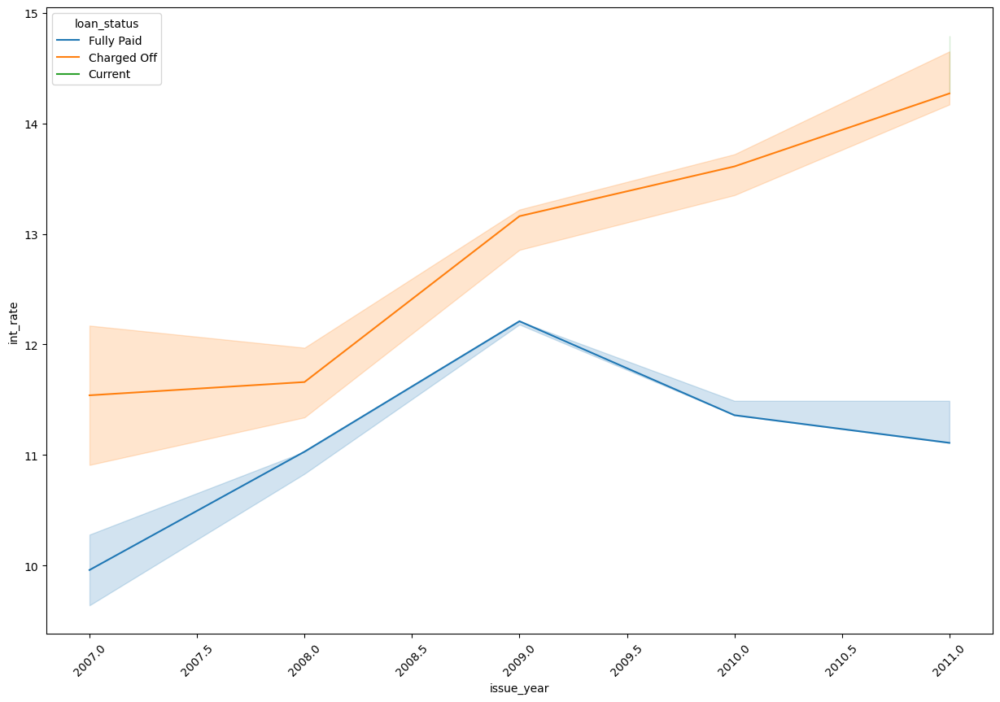

In [46]:
plt.figure(figsize=(15,10))
ax=sns.lineplot(data=loan,x='issue_year',y='int_rate',estimator=np.median,hue='loan_status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

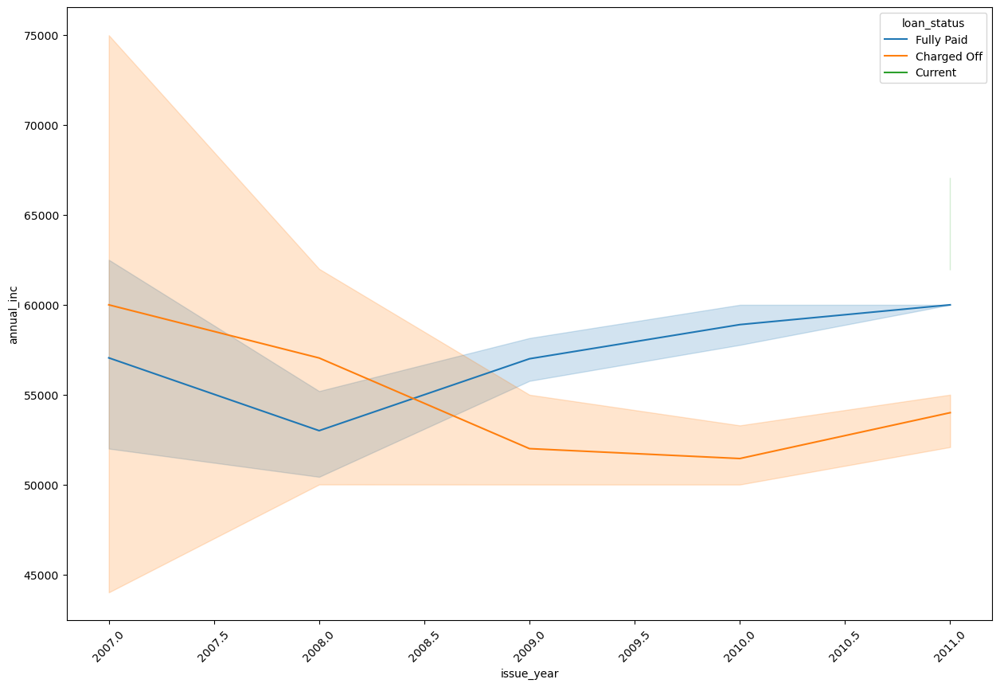

In [47]:
plt.figure(figsize=(15,10))
ax=sns.lineplot(data=loan,x='issue_year',y='annual_inc', estimator=np.median, hue='loan_status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

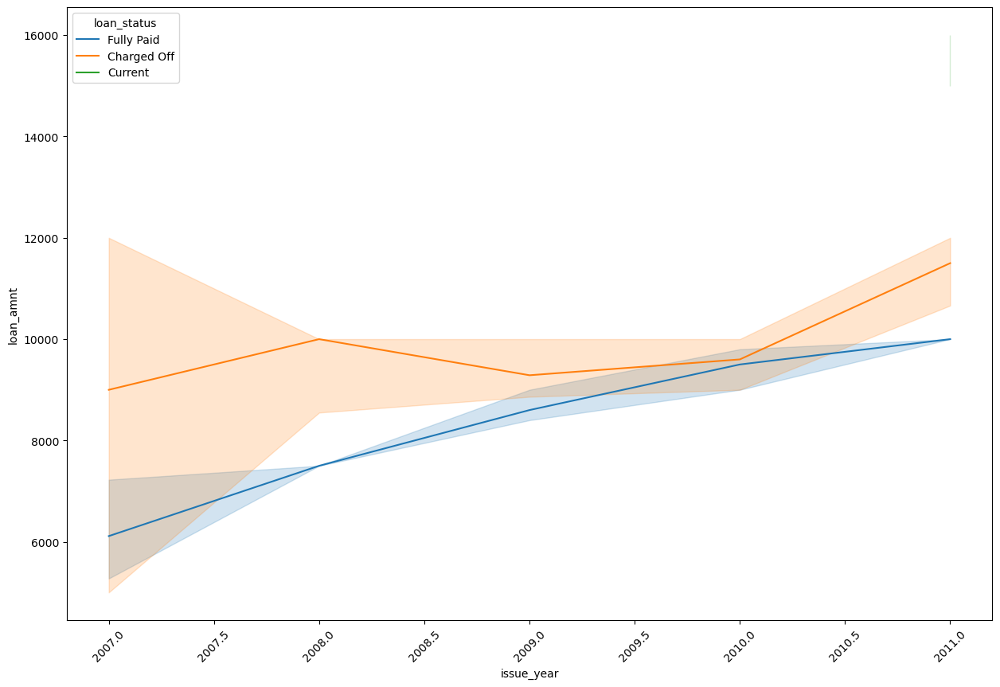

In [48]:
plt.figure(figsize=(15,10))
ax=sns.lineplot(data=loan,x='issue_year',y='loan_amnt', estimator=np.median,hue='loan_status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

##### Observations based on the lineplots for loan_amnt, int_rate and annual_inc
1. We see that the median interest rate for the 'Charged Off' loans was higher than the interest rates for 'Fully Paid' loans
2. Median Loan Amount for 'Charged Off' loans was higher than for the loans which were fully paid
3. Median annual income of the employees who defaulted is lower than the employeed who did not default

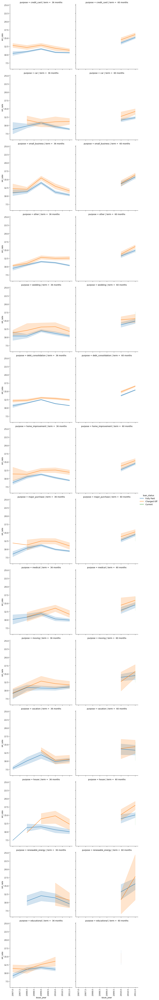

In [49]:
ax=sns.relplot(data=loan, x="issue_year",y='int_rate',hue='loan_status',row='purpose',col='term',kind='line')
ax.tick_params(axis='x', rotation=90)

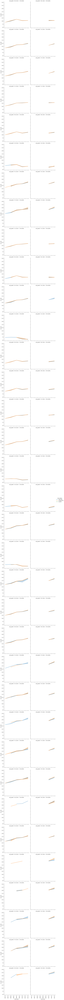

In [50]:
ax=sns.relplot(data=loan, x="issue_year",y='int_rate',hue='loan_status',row='sub_grade',col='term',kind='line')
ax.tick_params(axis='x', rotation=90)

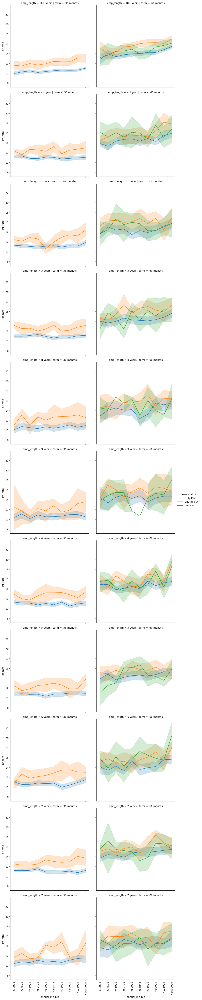

In [51]:
ax=sns.relplot(data=loan, x="annual_inc_bin",y='int_rate',hue='loan_status',row='emp_length',col='term',kind='line')
ax.tick_params(axis='x', rotation=90)

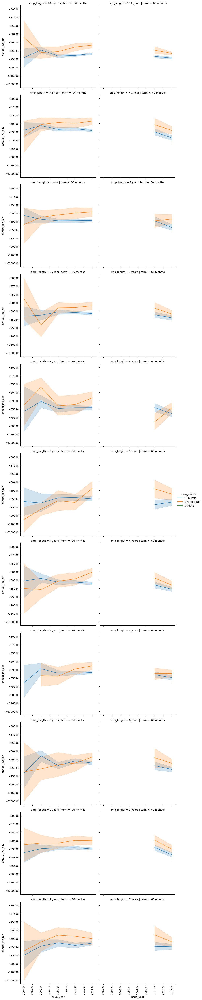

In [52]:
ax=sns.relplot(data=loan, x="issue_year",y='annual_inc_bin',hue='loan_status',row='emp_length',col='term',kind='line')
ax.tick_params(axis='x', rotation=90)

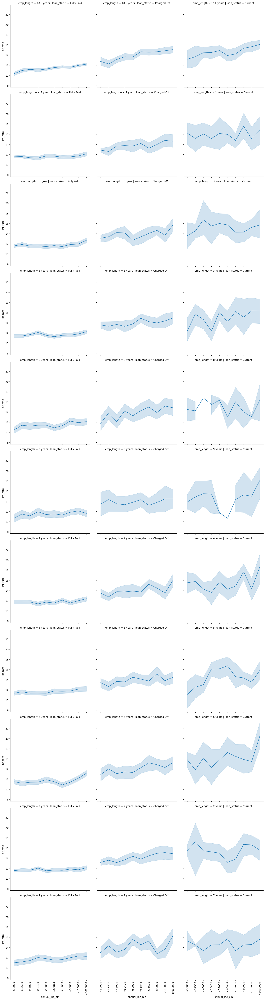

In [53]:
ax=sns.relplot(data=loan, x="annual_inc_bin",y="int_rate",row='emp_length',col='loan_status',kind='line')
ax.tick_params(axis='x', rotation=90)

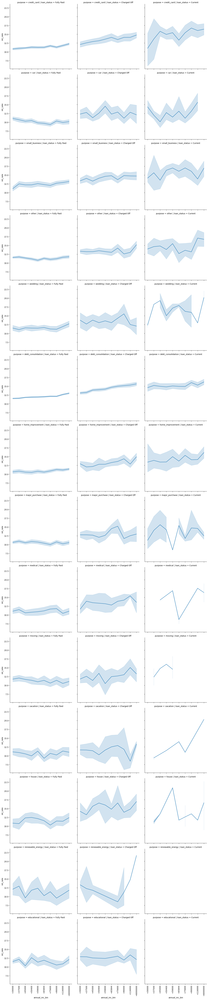

In [54]:
ax=sns.relplot(data=loan, x="annual_inc_bin",y="int_rate",row='purpose',col='loan_status',kind='line')
ax.tick_params(axis='x', rotation=90)

##### Obsrvations based on above relplots
1. It is becoming more apparant that interest rates are main driving factors behind the loan defaults
2. Loans which have defaulted have interest rates between 12.5-15 are mainly defaulting. 
3. Loans where the interest rates are between 10-12.5 have higher chances being paid fully
4. Interest rates are significantly higher (14-16%) for the employees with 7 years of experience, for 36 months term with annual salary between 50000-75000. 
5. Interest rates where loan has been taken for 'car','home_improvement','major_purchase','medical' is high(12-16%) for the 'Charged Off' loans. 
6. With regards to 'car' loans, interest rates are much higher for the charged off loans than the ones for the fully paid ones.

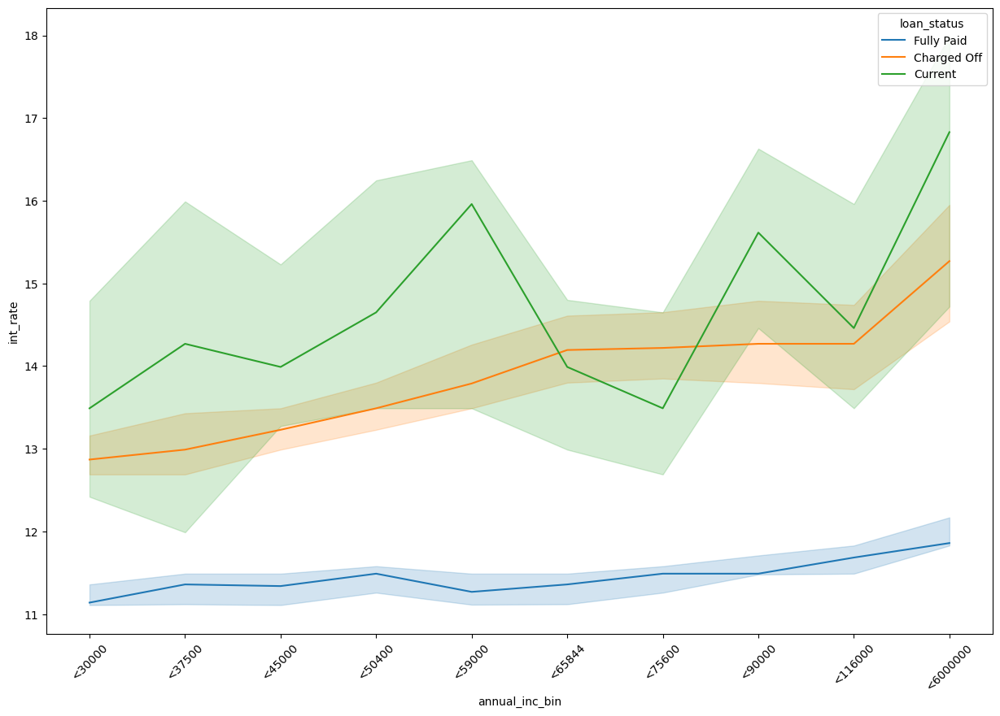

In [55]:
plt.figure(figsize=(15,10))
ax=sns.lineplot(data=loan,x='annual_inc_bin',y='int_rate', estimator=np.median,hue='loan_status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

##### Based on above graph, it does not look like that annual income has any effect on the interest rate

<Axes: >

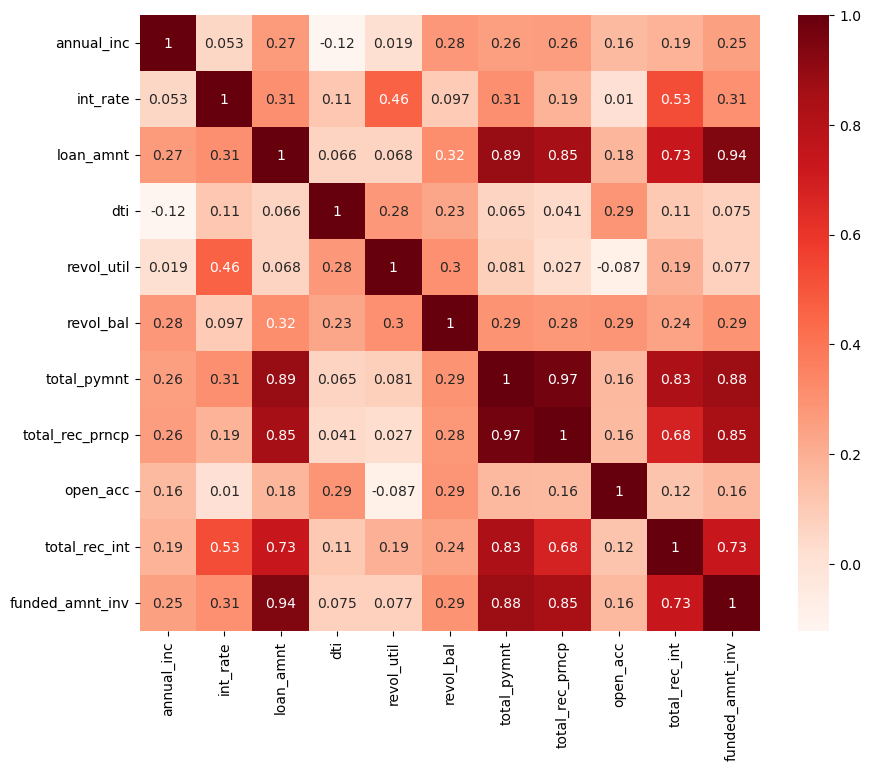

In [56]:
plt.figure(figsize=(10,8))
loan_corr = loan[['annual_inc','int_rate','loan_amnt','dti','revol_util','revol_bal','total_pymnt','total_rec_prncp','open_acc','total_rec_int','funded_amnt_inv']].corr()
sns.heatmap(loan_corr,cmap='Reds',annot=True)

##### Based on above heatmap, the correlation between int_rate and other numerical values is obvious and it is not apparant which value is driving higher interest rates

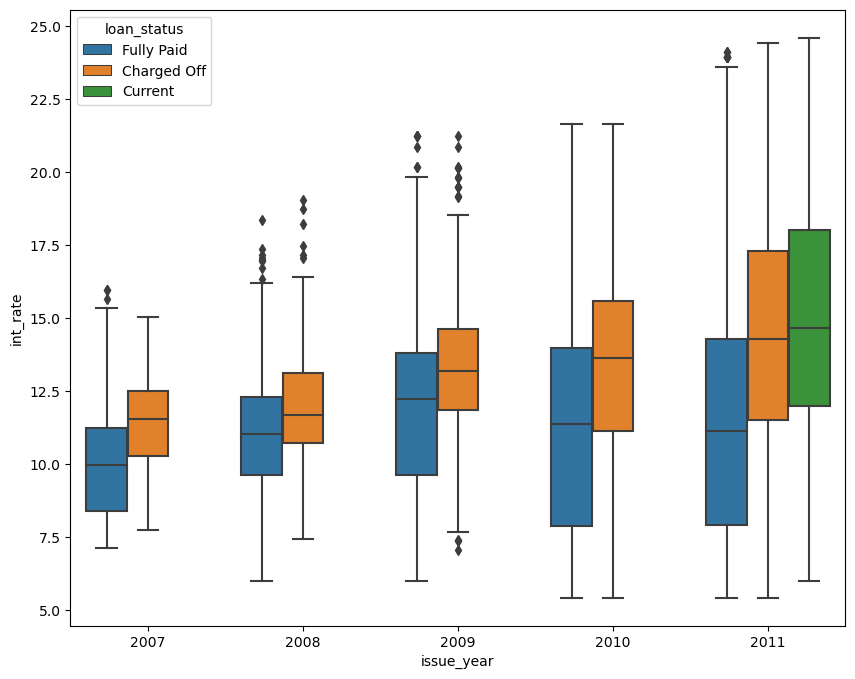

In [57]:
plt.figure(figsize=(10,8))
sns.boxplot(data=loan,x='issue_year',y='int_rate', hue='loan_status')
plt.show()

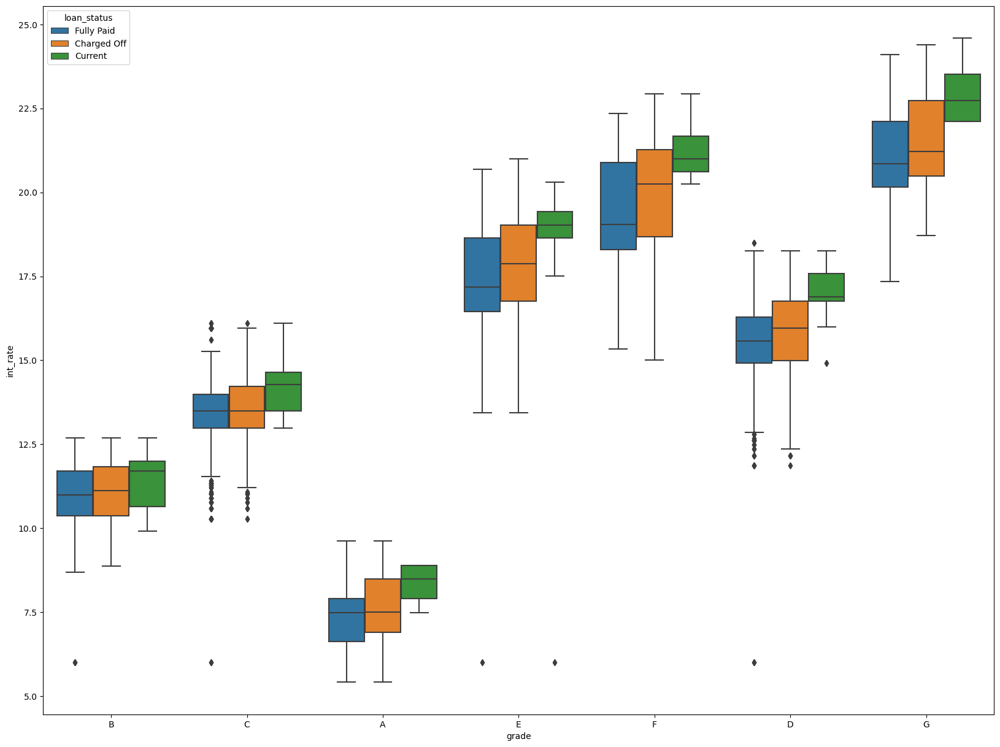

In [58]:
plt.figure(figsize=(20,15))
sns.boxplot(data=loan,x='grade',y='int_rate',hue='loan_status')
plt.show()

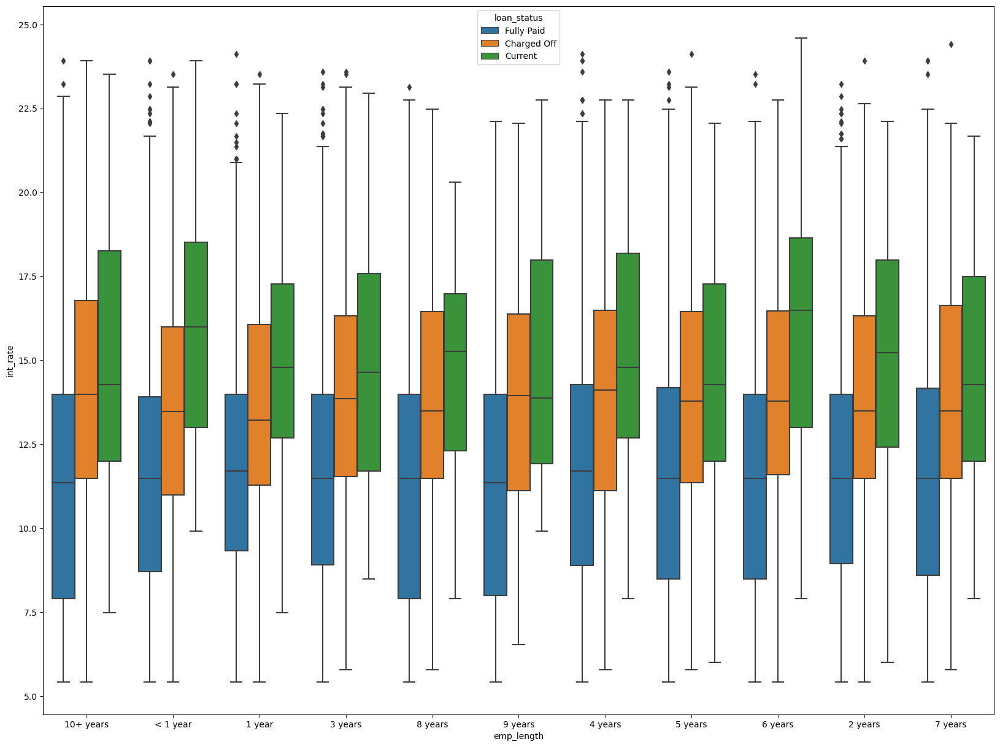

In [59]:
plt.figure(figsize=(20,15))
sns.boxplot(data=loan,x='emp_length',y='int_rate',hue='loan_status')
plt.show()

##### Observations
1. We see that interest rate are higher for the Grades G and F
2. Also the interest rates are higer for the loans issued in 2011.

# Summary and Conclusion

1. 18% of the employees whose income is less than 30000 have defaulted loans.
2. Employees where the home_ownership is either 'OTHER' or 'RENT' have high % of default
3. 45% of loans given to employees with sub-grade F5 have defaulted.
4. Loans with '60 months' term have defaulted more than loans with '36 months'
5. On an average 20% of Loans issued in Aug-07 until Dec-07 were defaulted.
6. We see this same trend for the loans issued 2011 where more and more loans are getting defaulted
7. 26% of the loans issued for the small_business have defaulted which is highest for the purpose
8. More than 20% loans issued in Nebraska, Nevada have been defaulted and more than 18% of the loans from Arkasnsas, South Dakota were defaulted. 
9. We see that the median interest rate for the 'Charged Off' loans was higher than the interest rates for 'Fully Paid' loans
10. Median Loan Amount for 'Charged Off' loans was higher than for the loans which were fully paid
11. Median annual income of the employees who defaulted is lower than the employees who did not default
12. Loans which have defaulted have interest rates between 12.5-15 are mainly defaulting. 
13. Loans where the interest rates are between 10-12.5 have higher chances being paid fully
14. Interest rates are significantly higher (14-16%) for the employees with 7 years of experience, for 36 months term with annual salary between 50000-75000. 

#### We also see that the loans which have been charged off are showing higher interest rates for any scenario. This could mean that, Lending institution has been taking care of issueing loans with higher interest rates where risk is higher. 

### Driving factors for loan defaults

These factors may or may not contribute to loan defaults but there is a higher risk of default associated with these factors

1. Chances of default increases as the annual income decreases. Applicants with salary less than 30000 have defaulted the most
2. Applicant has a sub-grade as F5 or G2 or G3 or G5
3. Loan is for 'small_business' or 'car'
4. Loan is for '60 months'
5. Applicant is from states - Nebraska, Nevada, Arkansasa or South Dakota